# ELAIS-N1 master catalogue
## Checks and diagnostics

In [1]:
from herschelhelp_internal import git_version
print("This notebook was run with herschelhelp_internal version: \n{}".format(git_version()))

This notebook was run with herschelhelp_internal version: 
02dd669 (Tue Aug 15 19:17:47 2017 +0100)


In [2]:
%matplotlib inline
#%config InlineBackend.figure_format = 'svg'

import matplotlib.pyplot as plt
plt.rc('figure', figsize=(10, 6))
plt.style.use('ggplot')

import locale
locale.setlocale(locale.LC_ALL, 'en_GB')

import os
import time
import itertools

from astropy.coordinates import SkyCoord
from astropy.table import Table
from astropy import units as u
from astropy import visualization as vis
import numpy as np
from matplotlib_venn import venn3

from herschelhelp_internal.masterlist import nb_compare_mags, nb_ccplots, nb_histograms

In [3]:
OUT_DIR = os.environ.get('OUT_DIR', "./data")
SUFFIX = os.environ.get('SUFFIX', time.strftime("_%Y%m%d"))
#SUFFIX = "_20170627"

master_catalogue = Table.read("{}/master_catalogue_elais-n1{}.fits".format(OUT_DIR, SUFFIX))

## I - Summary of wavelength domains

In [4]:
flag_obs = master_catalogue['flag_optnir_obs']
flag_det = master_catalogue['flag_optnir_det']

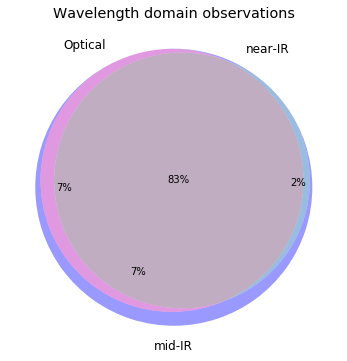

In [5]:
venn3(
    [
        np.sum(flag_obs == 4),
        np.sum(flag_obs == 2),
        np.sum(flag_obs == 6),
        np.sum(flag_obs == 1),
        np.sum(flag_obs == 5),
        np.sum(flag_obs == 3),
        np.sum(flag_obs == 7)
    ],
    set_labels=('Optical', 'near-IR', 'mid-IR'),
    subset_label_formatter=lambda x: "{}%".format(int(100*x/len(flag_obs)))
)
plt.title("Wavelength domain observations");

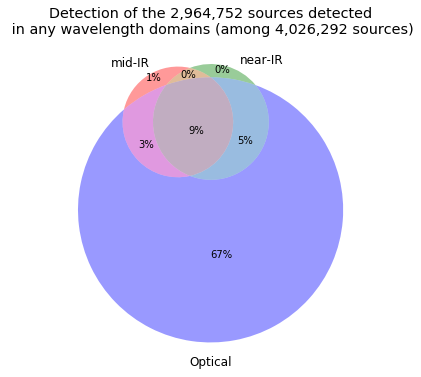

In [6]:
venn3(
    [
        np.sum(flag_det[flag_obs == 7] == 4),
        np.sum(flag_det[flag_obs == 7] == 2),
        np.sum(flag_det[flag_obs == 7] == 6),
        np.sum(flag_det[flag_obs == 7] == 1),
        np.sum(flag_det[flag_obs == 7] == 5),
        np.sum(flag_det[flag_obs == 7] == 3),
        np.sum(flag_det[flag_obs == 7] == 7)
    ],
    set_labels=('mid-IR', 'near-IR', 'Optical'),
    subset_label_formatter=lambda x: "{}%".format(int(100*x/np.sum(flag_det != 0)))
)
plt.title("Detection of the {} sources detected\n in any wavelength domains "
          "(among {} sources)".format(
              locale.format('%d', np.sum(flag_det != 0), grouping=True),
              locale.format('%d', len(flag_det), grouping=True)));

## II - Comparing magnitudes in similar filters

The master list if composed of several catalogues containing magnitudes in similar filters on different instruments. We are comparing the magnitudes in these corresponding filters.

In [7]:
u_bands = ["WFC u", "Megacam u"]
g_bands = ["WFC g", "Megacam g", "SUPRIME g", "GPC1 g"]
r_bands = ["WFC r", "Megacam r", "SUPRIME r", "GPC1 r"]
i_bands = ["WFC i", "SUPRIME i", "GPC1 i"]
z_bands = ["WFC z", "Megacam z", "SUPRIME z", "GPC1 z"]
y_bands = ["SUPRIME y", "GPC1 y"]

### II.a - Comparing depths

We compare the histograms of the total aperture magnitudes of similar bands.

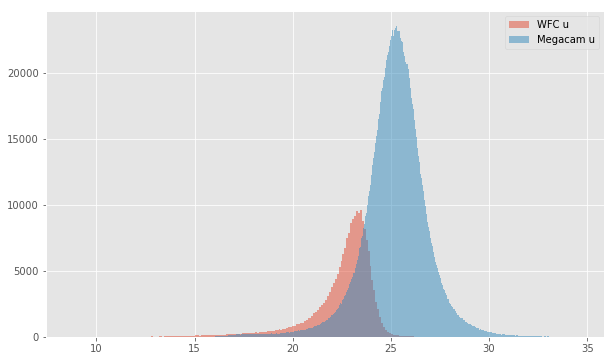

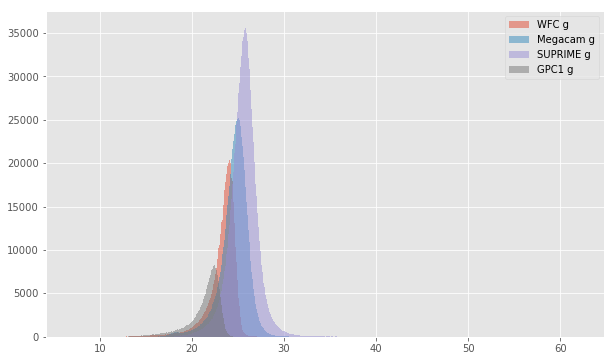

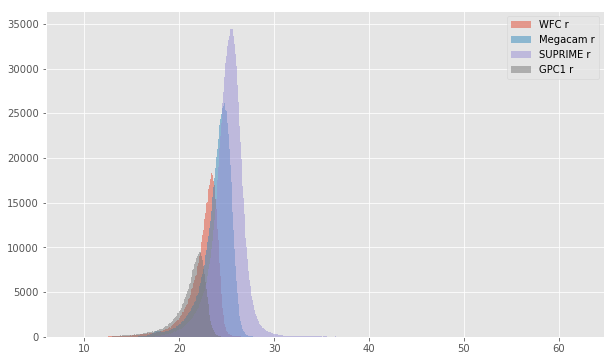

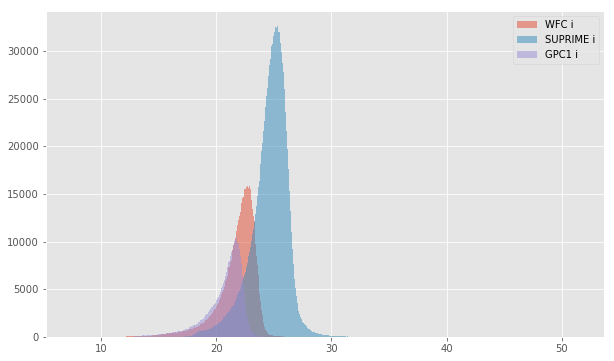

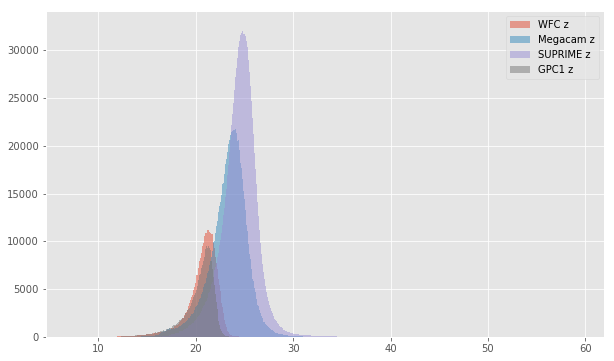

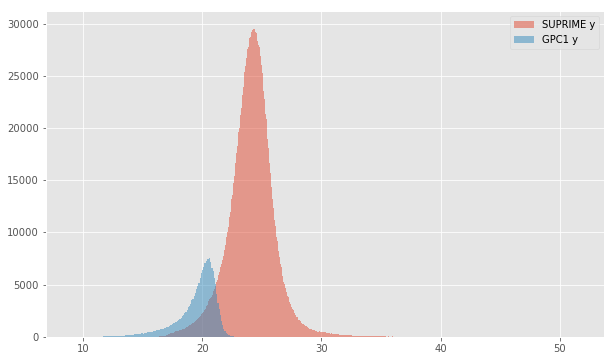

In [8]:
for bands in [u_bands, g_bands, r_bands, i_bands, z_bands, y_bands]:
    colnames = ["m_{}".format(band.replace(" ", "_").lower()) for band in bands]
    nb_histograms(master_catalogue, colnames, bands)

### II.b - Comparing magnitudes

We compare one to one each magnitude in similar bands.

Megacam u (aperture) - WFC u (aperture):
- Median: 0.10
- Median Absolute Deviation: 0.24
- 1% percentile: -0.7272730255126953
- 99% percentile: 2.3119604682922468


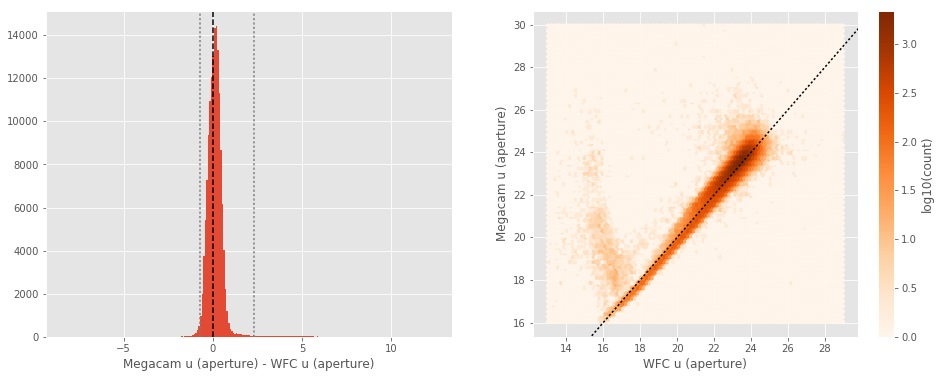

Megacam u (total) - WFC u (total):
- Median: -0.15
- Median Absolute Deviation: 0.21
- 1% percentile: -1.0918270874023437
- 99% percentile: 2.1320125770568796


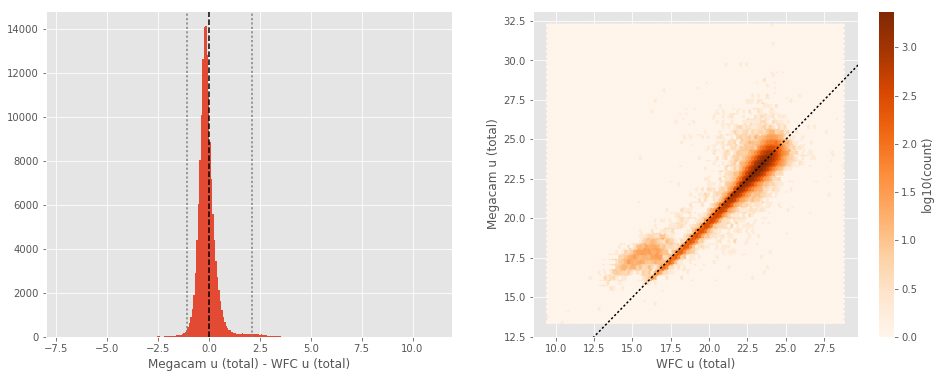

Megacam g (aperture) - WFC g (aperture):
- Median: 0.14
- Median Absolute Deviation: 0.15
- 1% percentile: -0.5219296264648438
- 99% percentile: 1.085785179138184


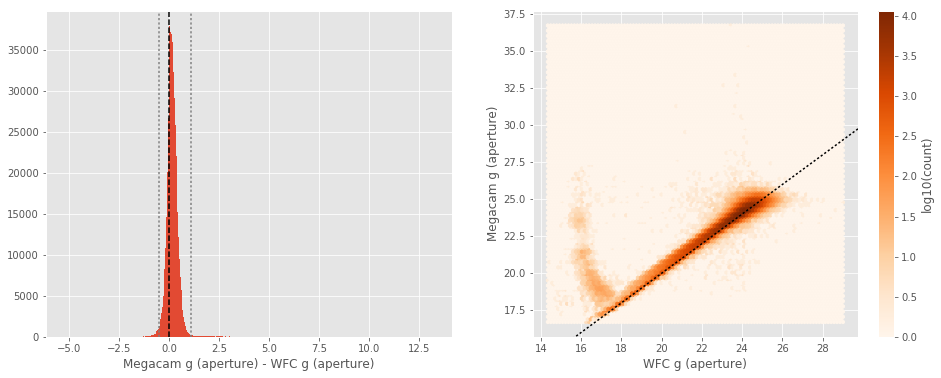

Megacam g (total) - WFC g (total):
- Median: -0.02
- Median Absolute Deviation: 0.15
- 1% percentile: -0.9512448883056641
- 99% percentile: 1.8764633178711005


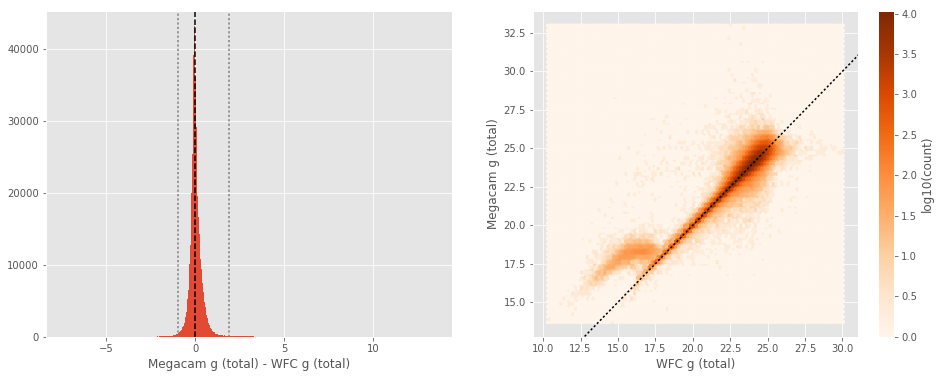

SUPRIME g (aperture) - WFC g (aperture):
- Median: 0.16
- Median Absolute Deviation: 0.16
- 1% percentile: -0.5483207702636718
- 99% percentile: 2.319765567779542


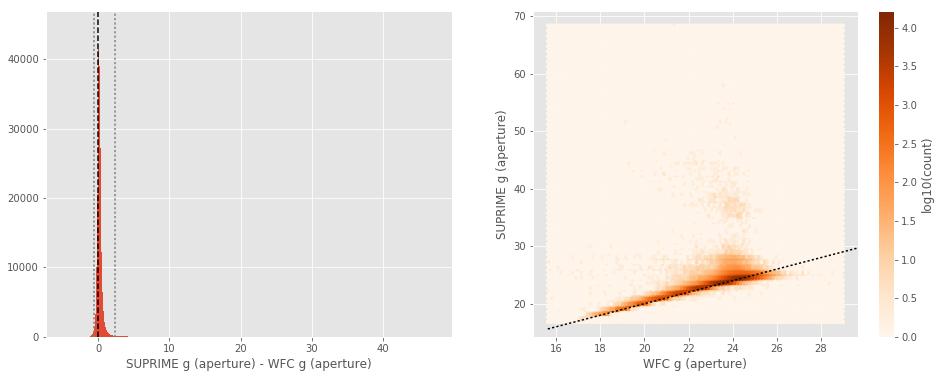

SUPRIME g (total) - WFC g (total):
- Median: 0.01
- Median Absolute Deviation: 0.19
- 1% percentile: -0.9150347518920898
- 99% percentile: 2.3162221145629904


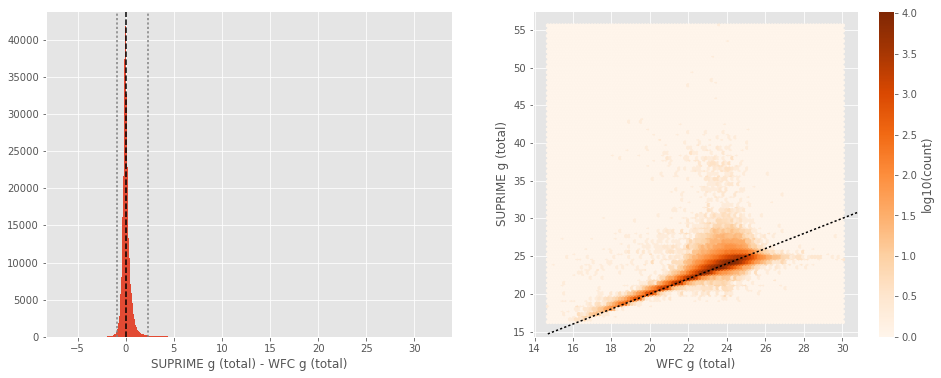

GPC1 g (aperture) - WFC g (aperture):
- Median: -0.03
- Median Absolute Deviation: 0.25
- 1% percentile: -1.4681995010375974
- 99% percentile: 2.598815269470216


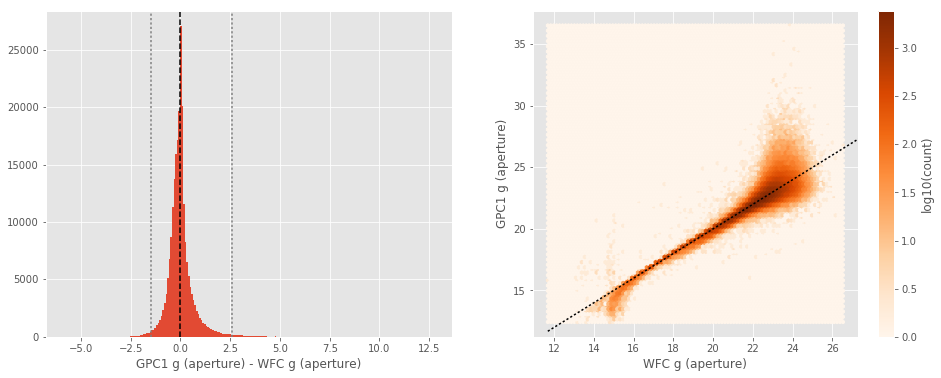

GPC1 g (total) - WFC g (total):
- Median: 0.06
- Median Absolute Deviation: 0.15
- 1% percentile: -1.235805778503418
- 99% percentile: 0.8852024841308583


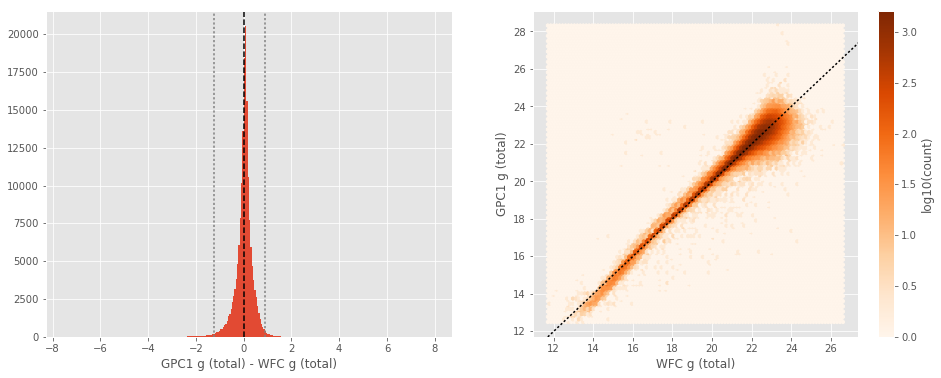

SUPRIME g (aperture) - Megacam g (aperture):
- Median: -0.03
- Median Absolute Deviation: 0.11
- 1% percentile: -0.6601028442382812
- 99% percentile: 2.253218078613278


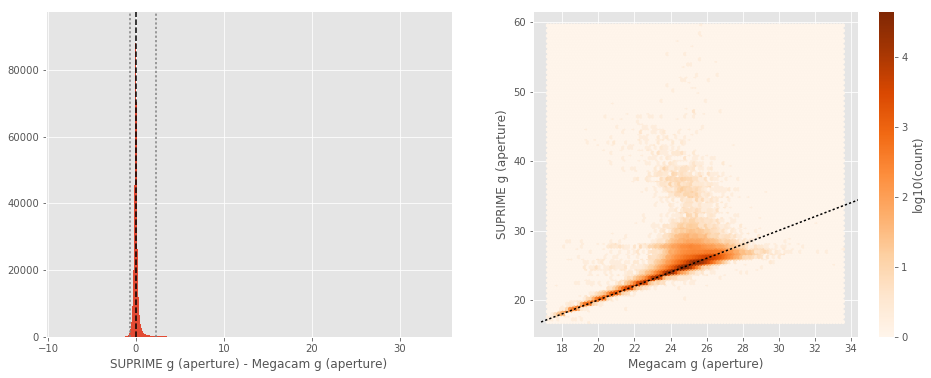

SUPRIME g (total) - Megacam g (total):
- Median: -0.08
- Median Absolute Deviation: 0.20
- 1% percentile: -1.6540432739257813
- 99% percentile: 2.5875380706787094


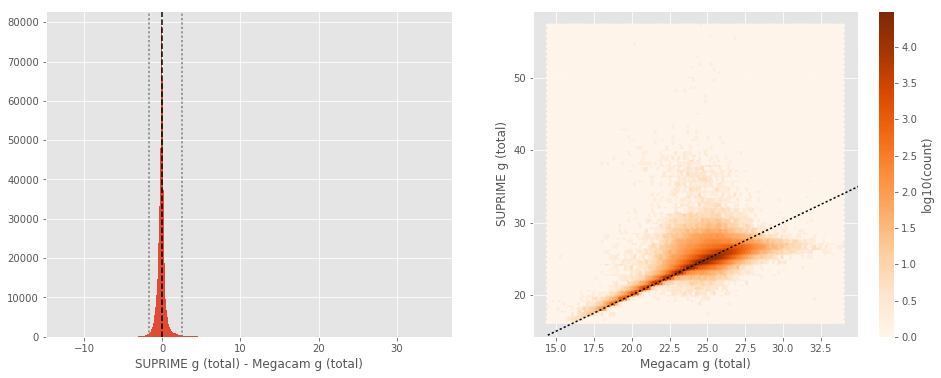

GPC1 g (aperture) - Megacam g (aperture):
- Median: -0.19
- Median Absolute Deviation: 0.35
- 1% percentile: -2.7744883155822753
- 99% percentile: 2.5329534912109364


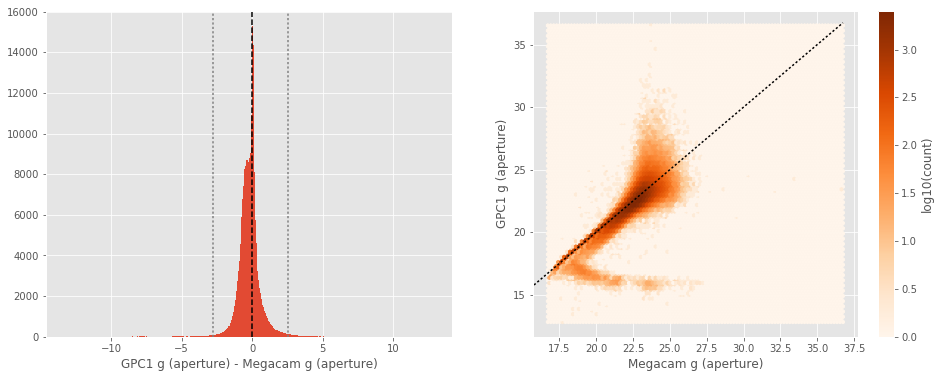

GPC1 g (total) - Megacam g (total):
- Median: 0.08
- Median Absolute Deviation: 0.15
- 1% percentile: -3.053208236694336
- 99% percentile: 0.909821548461915


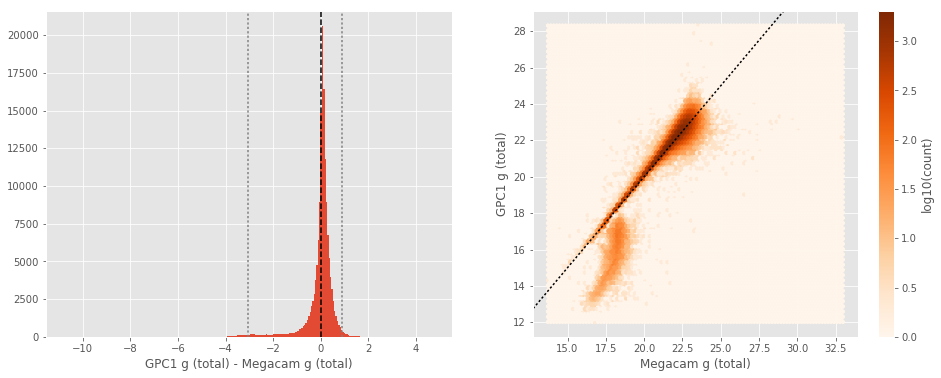

GPC1 g (aperture) - SUPRIME g (aperture):
- Median: -0.25
- Median Absolute Deviation: 0.35
- 1% percentile: -2.450922222137451
- 99% percentile: 2.5137275123596465


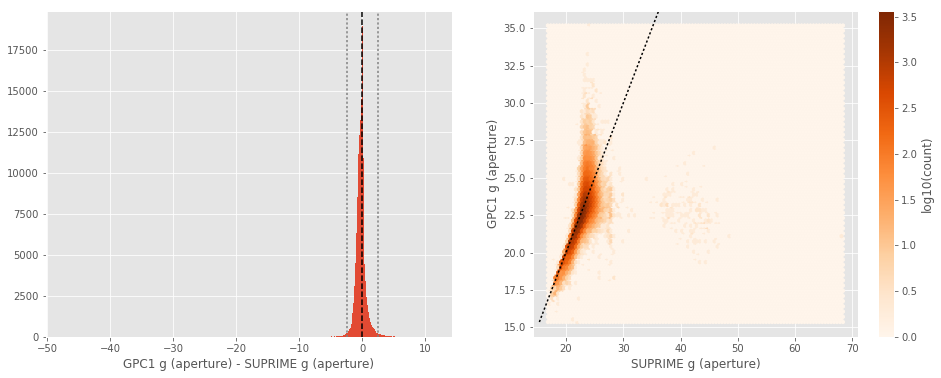

GPC1 g (total) - SUPRIME g (total):
- Median: 0.01
- Median Absolute Deviation: 0.17
- 1% percentile: -1.6039471626281738
- 99% percentile: 0.8286709785461426


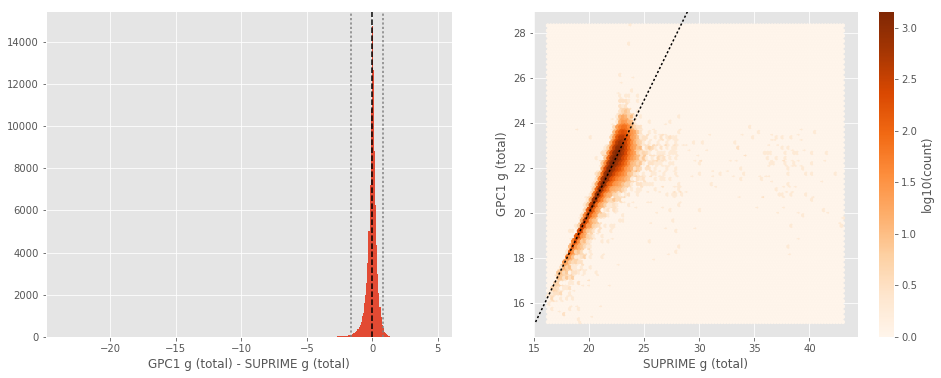

Megacam r (aperture) - WFC r (aperture):
- Median: 0.12
- Median Absolute Deviation: 0.15
- 1% percentile: -0.5586348533630371
- 99% percentile: 1.2267741394042968


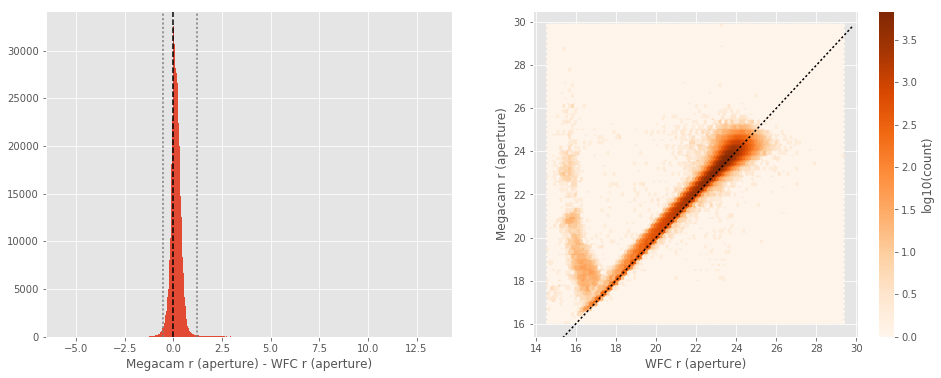

Megacam r (total) - WFC r (total):
- Median: -0.07
- Median Absolute Deviation: 0.13
- 1% percentile: -0.9979226684570313
- 99% percentile: 1.865820007324213


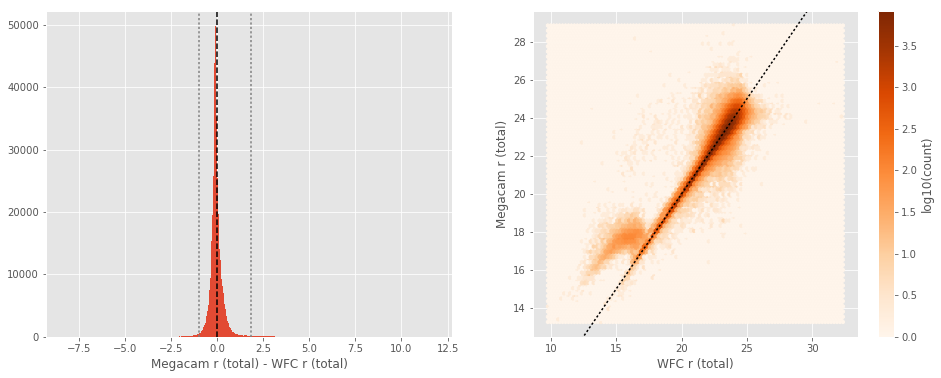

SUPRIME r (aperture) - WFC r (aperture):
- Median: 0.09
- Median Absolute Deviation: 0.15
- 1% percentile: -0.6121678924560547
- 99% percentile: 3.518004989624025


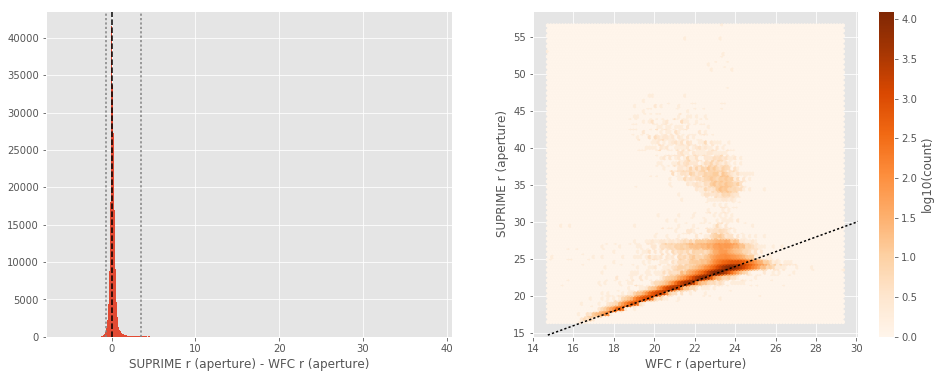

SUPRIME r (total) - WFC r (total):
- Median: -0.05
- Median Absolute Deviation: 0.16
- 1% percentile: -0.9259447097778319
- 99% percentile: 3.3509555816649943


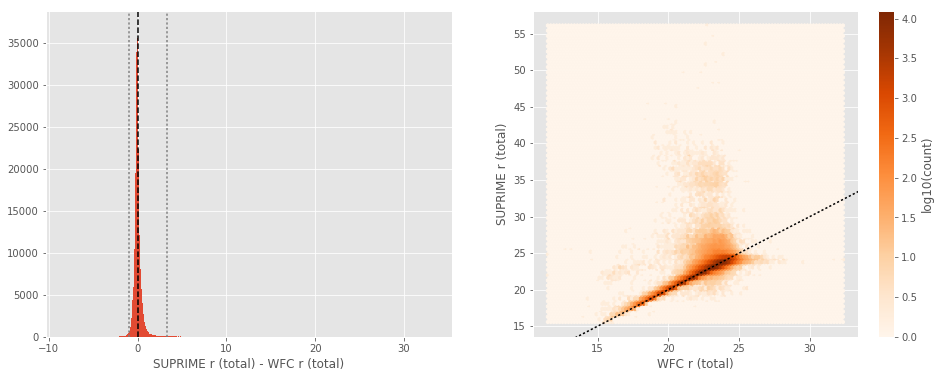

GPC1 r (aperture) - WFC r (aperture):
- Median: -0.05
- Median Absolute Deviation: 0.14
- 1% percentile: -1.0388346672058106
- 99% percentile: 1.5338702201843275


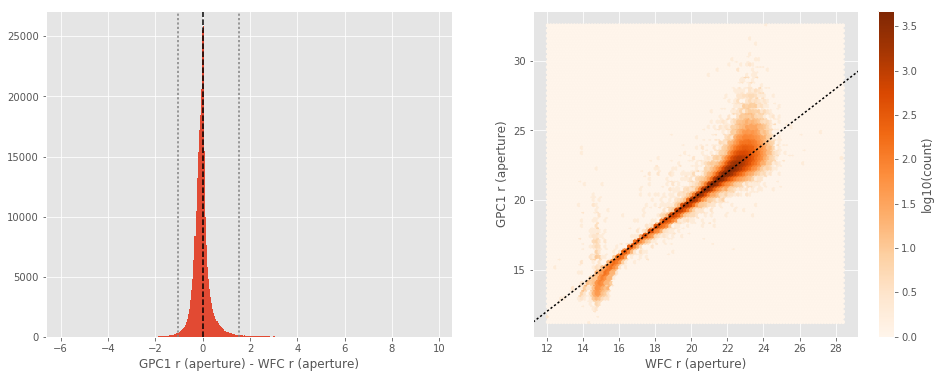

GPC1 r (total) - WFC r (total):
- Median: 0.03
- Median Absolute Deviation: 0.12
- 1% percentile: -0.9682998657226562
- 99% percentile: 0.8239599800109849


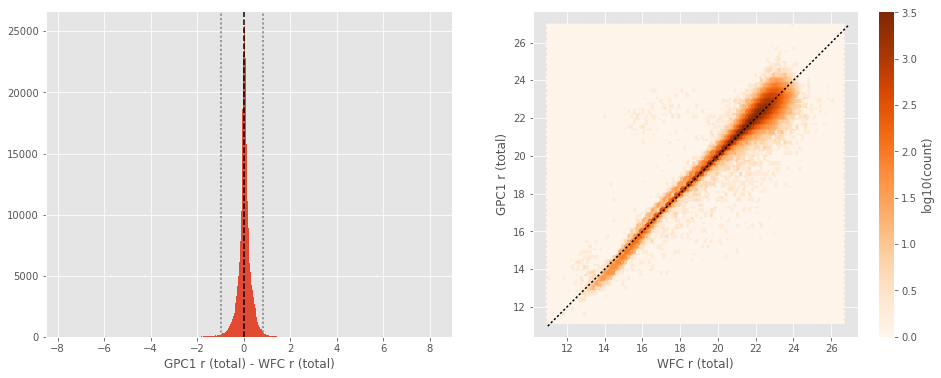

SUPRIME r (aperture) - Megacam r (aperture):
- Median: -0.04
- Median Absolute Deviation: 0.11
- 1% percentile: -0.6416191864013672
- 99% percentile: 2.4968240737914904


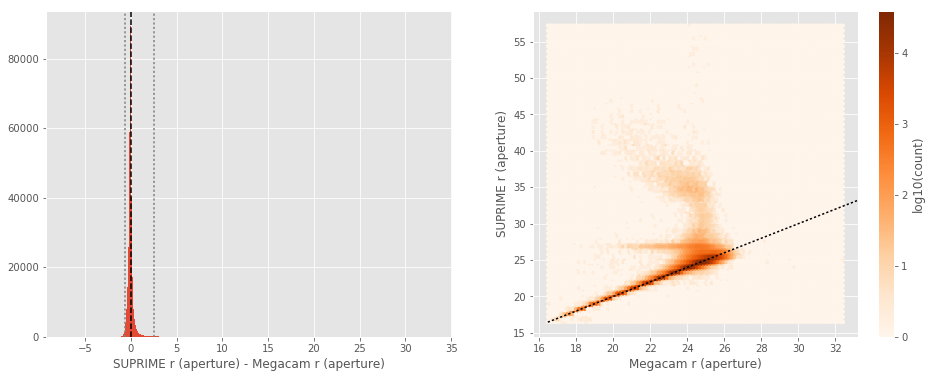

SUPRIME r (total) - Megacam r (total):
- Median: -0.05
- Median Absolute Deviation: 0.20
- 1% percentile: -1.462252655029297
- 99% percentile: 2.9655048751831057


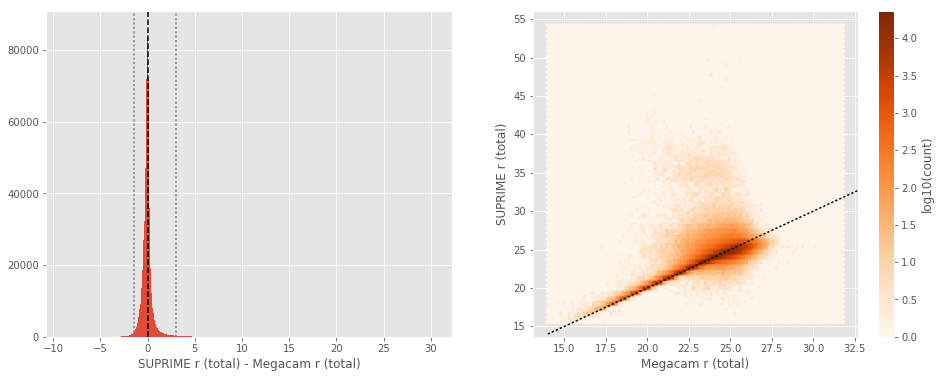

GPC1 r (aperture) - Megacam r (aperture):
- Median: -0.16
- Median Absolute Deviation: 0.24
- 1% percentile: -2.5137132263183597
- 99% percentile: 1.4576556015014677


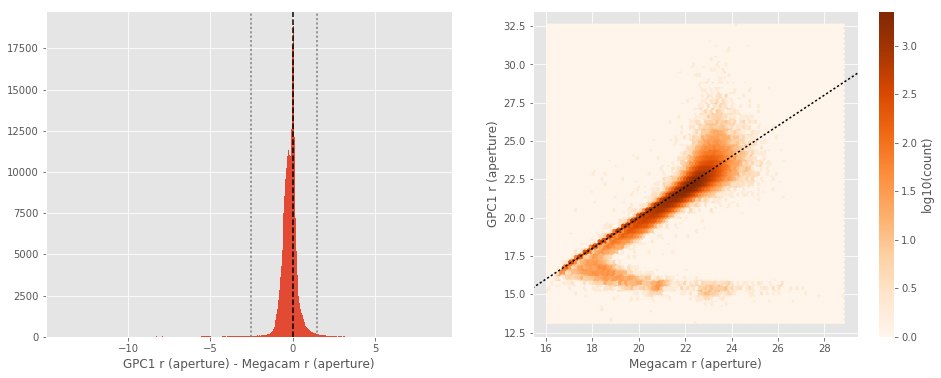

GPC1 r (total) - Megacam r (total):
- Median: 0.11
- Median Absolute Deviation: 0.11
- 1% percentile: -2.6895561695098875
- 99% percentile: 0.8498268508911129


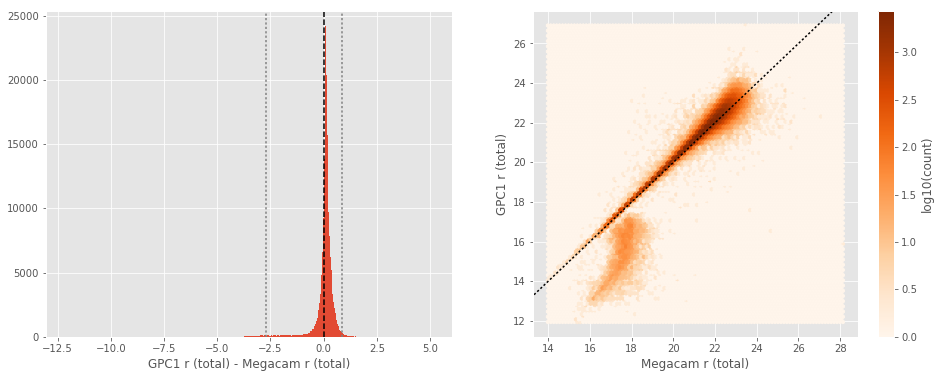

GPC1 r (aperture) - SUPRIME r (aperture):
- Median: -0.16
- Median Absolute Deviation: 0.23
- 1% percentile: -2.961479415893555
- 99% percentile: 1.4932370567321622


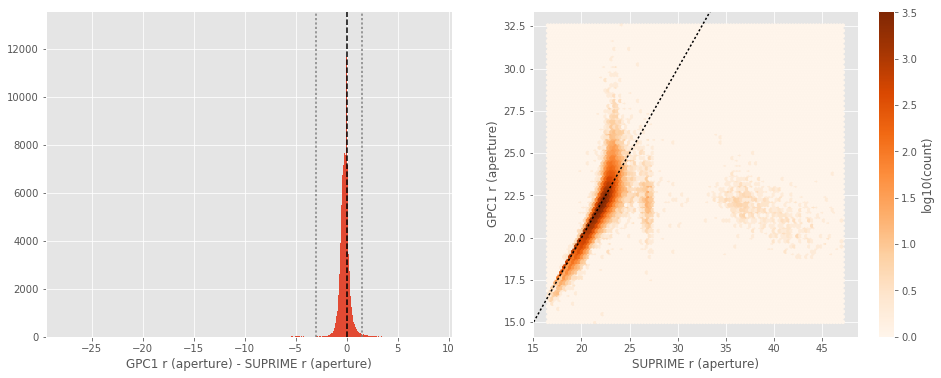

GPC1 r (total) - SUPRIME r (total):
- Median: 0.06
- Median Absolute Deviation: 0.13
- 1% percentile: -2.829697322845459
- 99% percentile: 0.7763437843322756


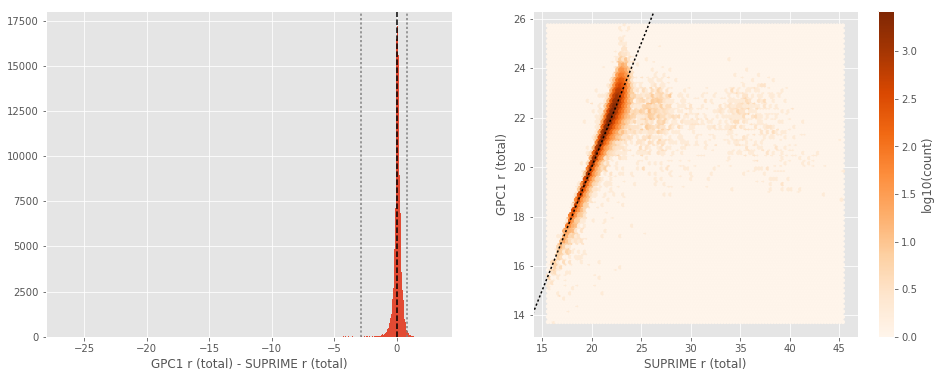

SUPRIME i (aperture) - WFC i (aperture):
- Median: 0.07
- Median Absolute Deviation: 0.15
- 1% percentile: -0.7344942092895508
- 99% percentile: 1.4884119033813477


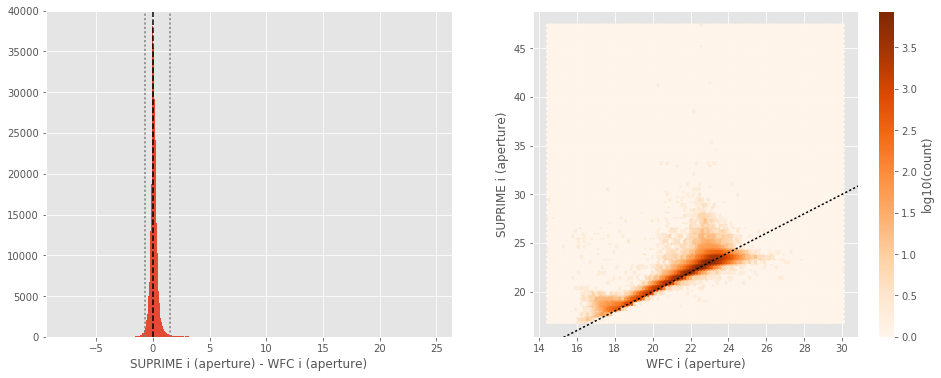

SUPRIME i (total) - WFC i (total):
- Median: -0.13
- Median Absolute Deviation: 0.17
- 1% percentile: -1.0118545150756835
- 99% percentile: 1.584526290893563


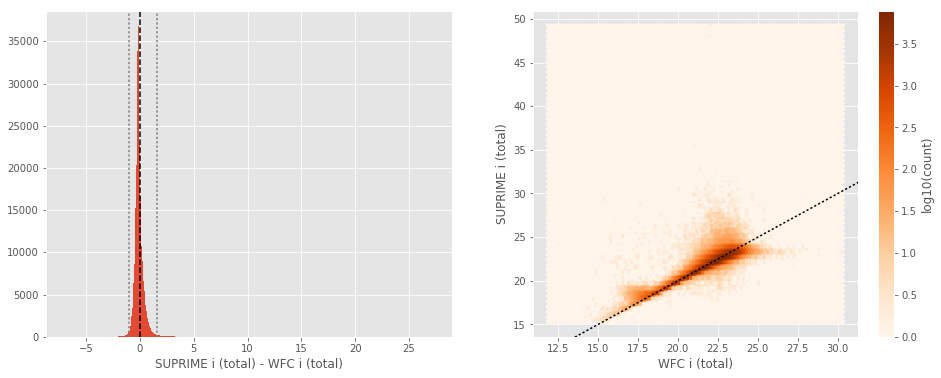

GPC1 i (aperture) - WFC i (aperture):
- Median: -0.01
- Median Absolute Deviation: 0.11
- 1% percentile: -0.7514700889587402
- 99% percentile: 0.7729697227478038


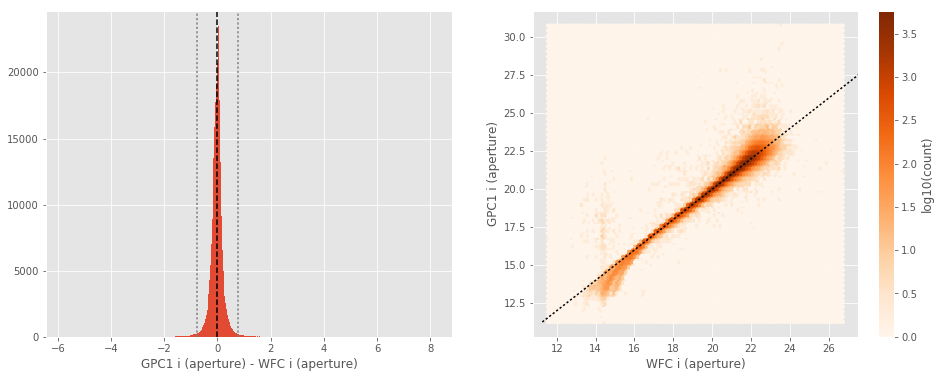

GPC1 i (total) - WFC i (total):
- Median: 0.06
- Median Absolute Deviation: 0.11
- 1% percentile: -0.8002008056640624
- 99% percentile: 0.8199679565429681


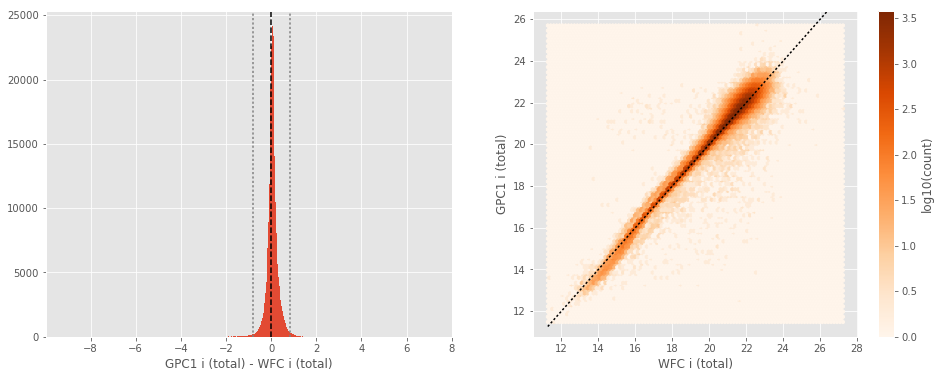

GPC1 i (aperture) - SUPRIME i (aperture):
- Median: -0.09
- Median Absolute Deviation: 0.19
- 1% percentile: -1.259005832672119
- 99% percentile: 0.6624520874023434


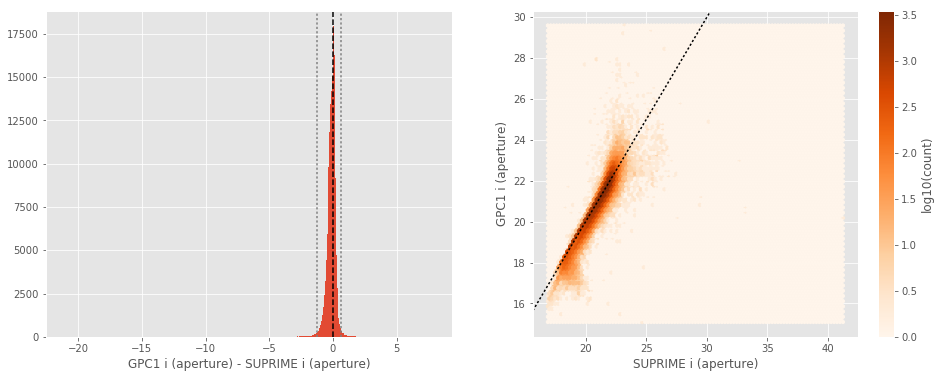

GPC1 i (total) - SUPRIME i (total):
- Median: 0.18
- Median Absolute Deviation: 0.10
- 1% percentile: -1.0342599487304687
- 99% percentile: 0.6791699981689452


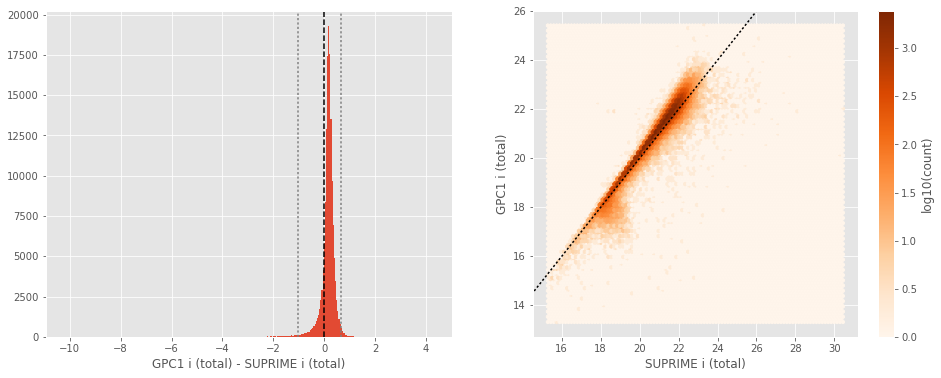

Megacam z (aperture) - WFC z (aperture):
- Median: 0.13
- Median Absolute Deviation: 0.18
- 1% percentile: -0.7321368980407714
- 99% percentile: 3.3361961364746464


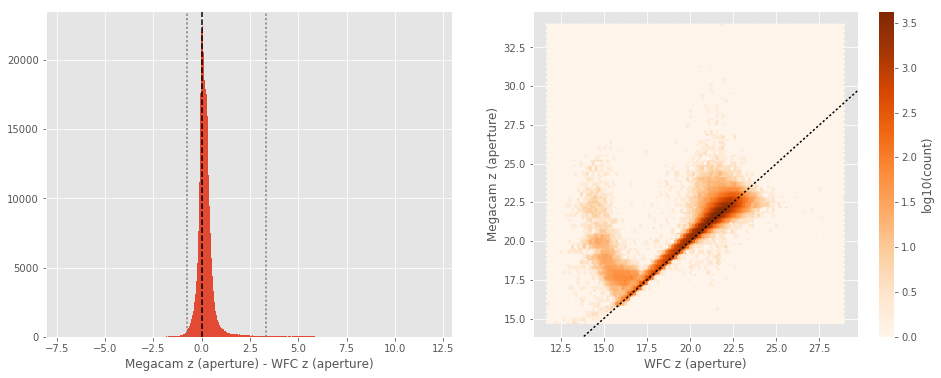

Megacam z (total) - WFC z (total):
- Median: -0.07
- Median Absolute Deviation: 0.20
- 1% percentile: -0.9955057525634765
- 99% percentile: 2.3412176895141594


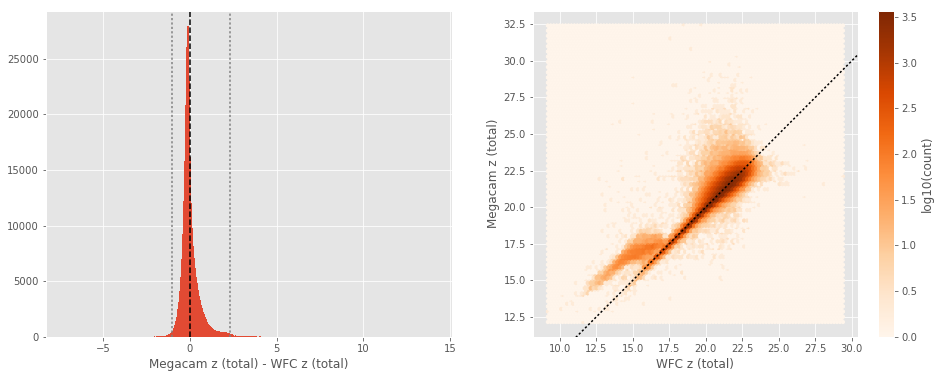

SUPRIME z (aperture) - WFC z (aperture):
- Median: 0.10
- Median Absolute Deviation: 0.17
- 1% percentile: -0.7828454971313477
- 99% percentile: 2.5906721115112408


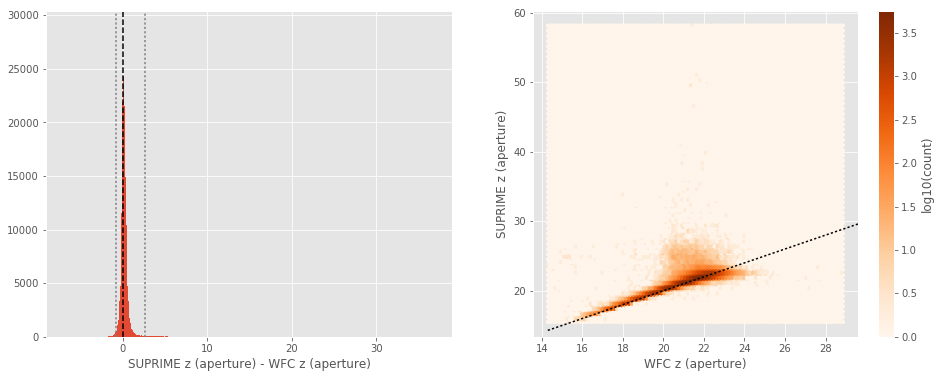

SUPRIME z (total) - WFC z (total):
- Median: -0.03
- Median Absolute Deviation: 0.22
- 1% percentile: -0.9388100051879882
- 99% percentile: 2.6204393005370985


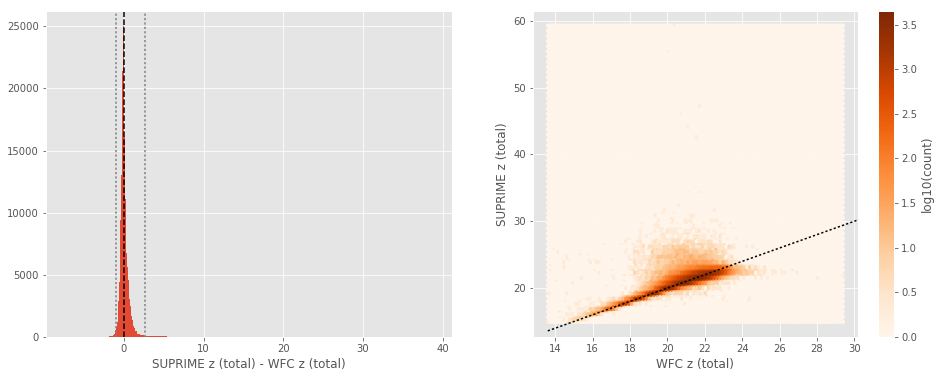

GPC1 z (aperture) - WFC z (aperture):
- Median: 0.01
- Median Absolute Deviation: 0.15
- 1% percentile: -0.8958967590332031
- 99% percentile: 1.408468627929681


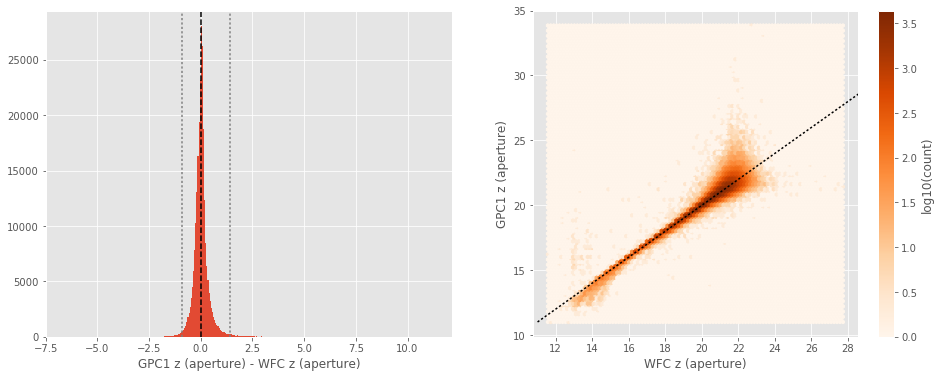

GPC1 z (total) - WFC z (total):
- Median: 0.07
- Median Absolute Deviation: 0.16
- 1% percentile: -0.8547391891479492
- 99% percentile: 1.3617404937744164


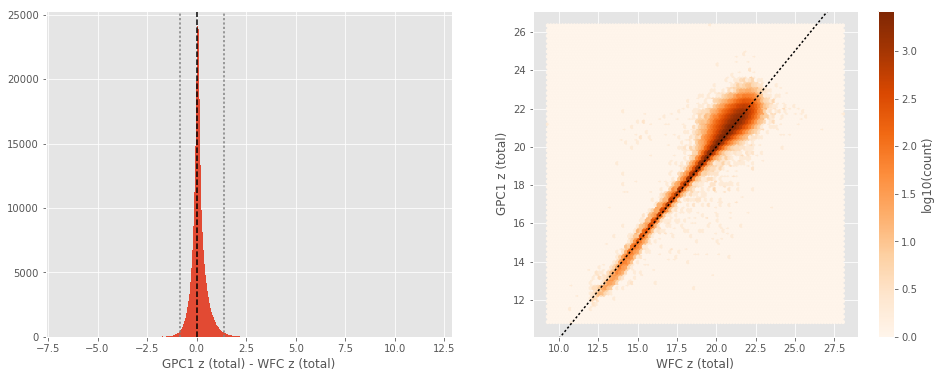

SUPRIME z (aperture) - Megacam z (aperture):
- Median: -0.04
- Median Absolute Deviation: 0.15
- 1% percentile: -1.104429817199707
- 99% percentile: 1.5991294288635258


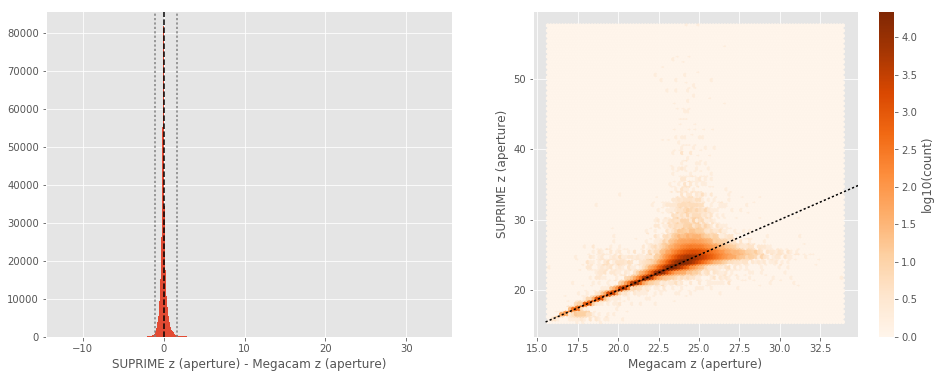

SUPRIME z (total) - Megacam z (total):
- Median: -0.07
- Median Absolute Deviation: 0.28
- 1% percentile: -3.1023595046997072
- 99% percentile: 2.069321308135987


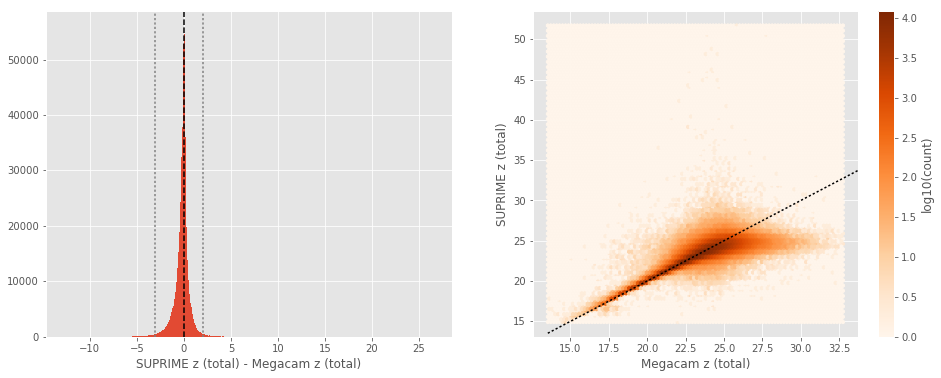

GPC1 z (aperture) - Megacam z (aperture):
- Median: -0.09
- Median Absolute Deviation: 0.22
- 1% percentile: -3.8263822555541993
- 99% percentile: 1.387774467468262


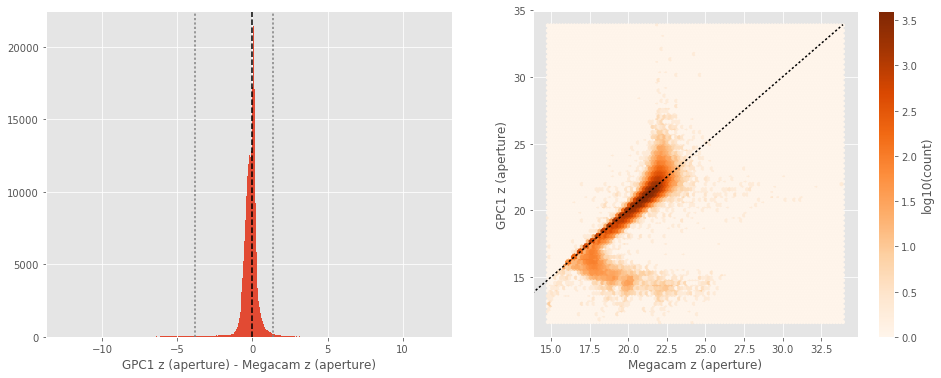

GPC1 z (total) - Megacam z (total):
- Median: 0.17
- Median Absolute Deviation: 0.11
- 1% percentile: -2.2160144233703614
- 99% percentile: 0.9042765426635738


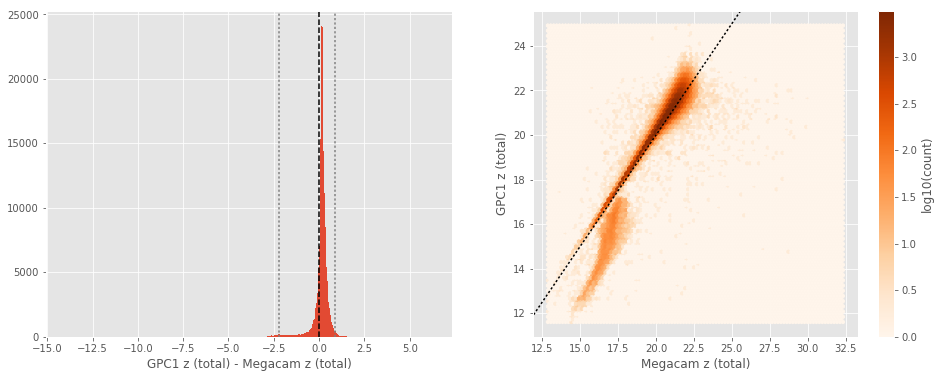

GPC1 z (aperture) - SUPRIME z (aperture):
- Median: -0.05
- Median Absolute Deviation: 0.21
- 1% percentile: -1.0826454162597656
- 99% percentile: 1.4541187286376953


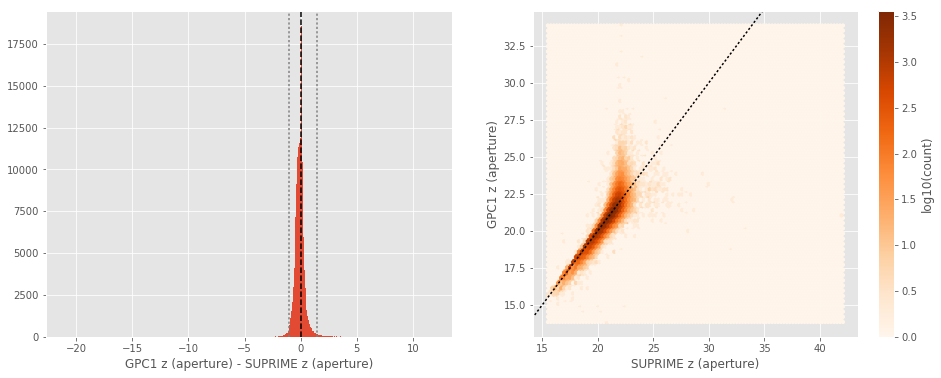

GPC1 z (total) - SUPRIME z (total):
- Median: 0.13
- Median Absolute Deviation: 0.13
- 1% percentile: -0.7019862365722657
- 99% percentile: 0.8331898117065466


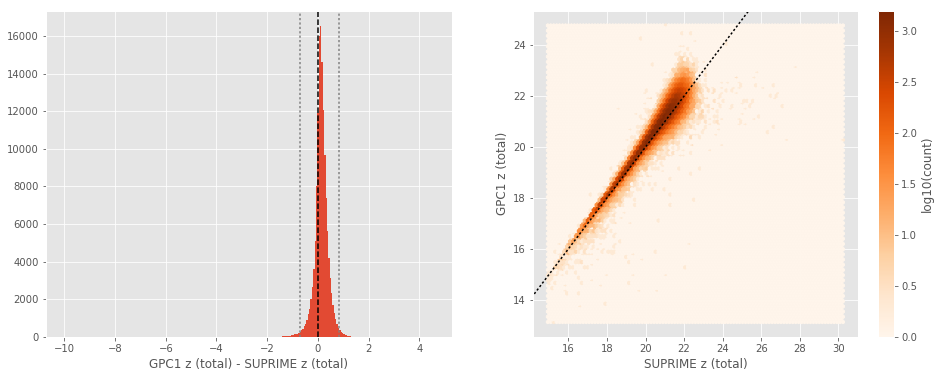

GPC1 y (aperture) - SUPRIME y (aperture):
- Median: -0.11
- Median Absolute Deviation: 0.29
- 1% percentile: -1.6758161926269532
- 99% percentile: 2.540292816162108


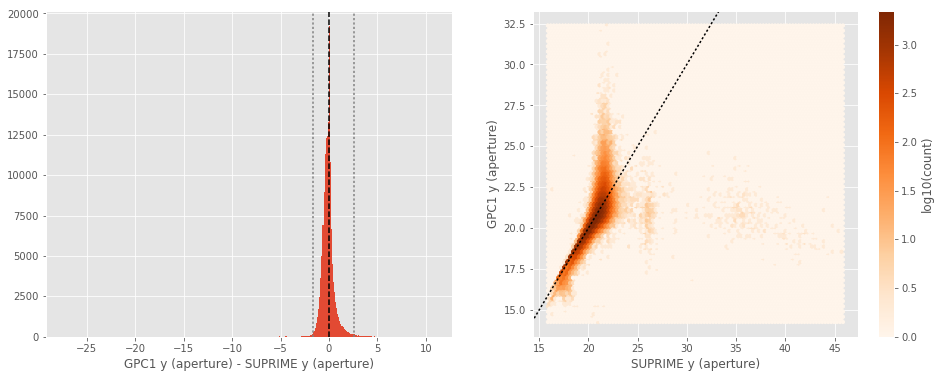

GPC1 y (total) - SUPRIME y (total):
- Median: 0.20
- Median Absolute Deviation: 0.16
- 1% percentile: -1.1161381721496582
- 99% percentile: 1.035216197967529


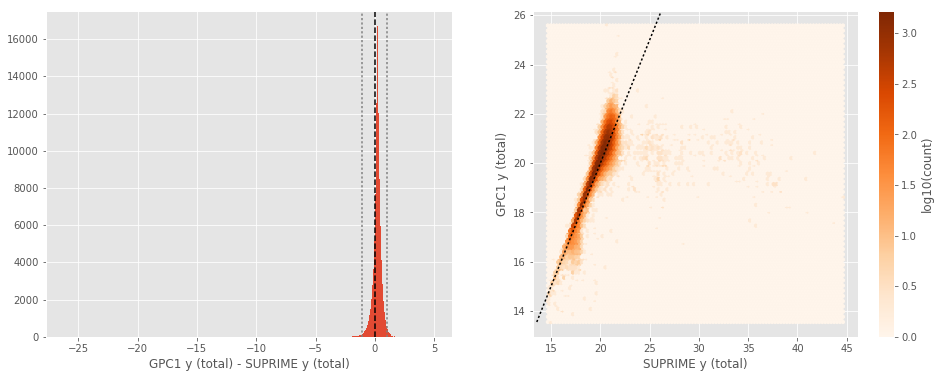

In [9]:
for band_of_a_kind in [u_bands, g_bands, r_bands, i_bands, z_bands, y_bands]:
    for band1, band2 in itertools.combinations(band_of_a_kind, 2):
        
        basecol1, basecol2 = band1.replace(" ", "_").lower(), band2.replace(" ", "_").lower()
        
        col1, col2 = "m_ap_{}".format(basecol1), "m_ap_{}".format(basecol2)
        nb_compare_mags(master_catalogue[col1], master_catalogue[col2], 
                        labels=("{} (aperture)".format(band1), "{} (aperture)".format(band2)))
        
        col1, col2 = "m_{}".format(basecol1), "m_{}".format(basecol2)
        nb_compare_mags(master_catalogue[col1], master_catalogue[col2], 
                        labels=("{} (total)".format(band1), "{} (total)".format(band2)))

## III - Comparing magnitudes to reference bands

Cross-match the master list to SDSS and 2MASS to compare its magnitudes to SDSS and 2MASS ones.

In [10]:
master_catalogue_coords = SkyCoord(master_catalogue['ra'], master_catalogue['dec'])

### III.a - Comparing u, g, r, i, and z bands to SDSS

The catalogue is cross-matched to SDSS-DR13 withing 0.2 arcsecond. 

We compare the u, g, r, i, and z magnitudes to those from SDSS using `fiberMag` for the aperture magnitude and `petroMag`  for the total magnitude.

In [11]:
sdss = Table.read("../../dmu0/dmu0_SDSS-DR13/data/SDSS-DR13_ELAIS-N1.fits")
sdss_coords = SkyCoord(sdss['ra'] * u.deg, sdss['dec'] * u.deg)

idx, d2d, _ = sdss_coords.match_to_catalog_sky(master_catalogue_coords)
mask = (d2d < 0.2 * u.arcsec)

sdss = sdss[mask]
ml_sdss_idx = idx[mask]

WFC u (aperture) - SDSS u (fiberMag):
- Median: -0.37
- Median Absolute Deviation: 0.26
- 1% percentile: -2.1387645721435544
- 99% percentile: 1.0094253540039075


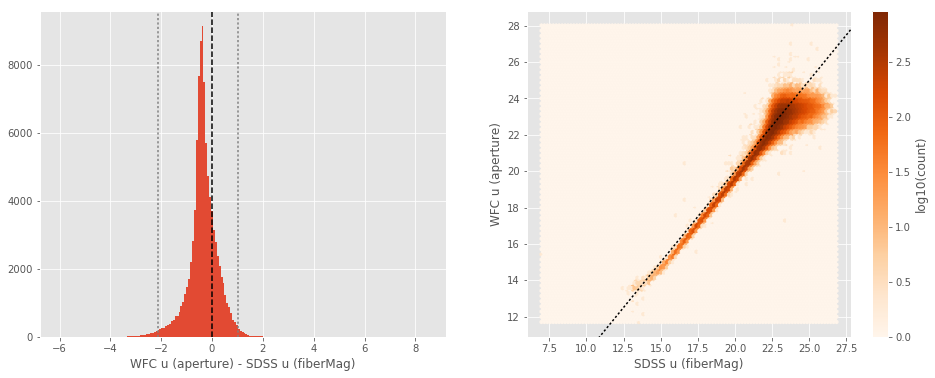

WFC u (total) - SDSS u (petroMag):
- Median: -0.37
- Median Absolute Deviation: 0.26
- 1% percentile: -2.1387645721435544
- 99% percentile: 1.0094253540039075


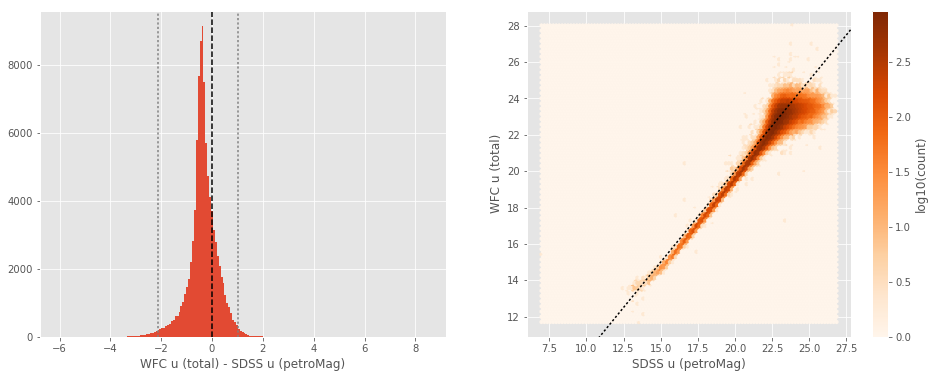

Megacam u (aperture) - SDSS u (fiberMag):
- Median: -0.04
- Median Absolute Deviation: 0.59
- 1% percentile: -2.044686393737793
- 99% percentile: 3.2575323295593246


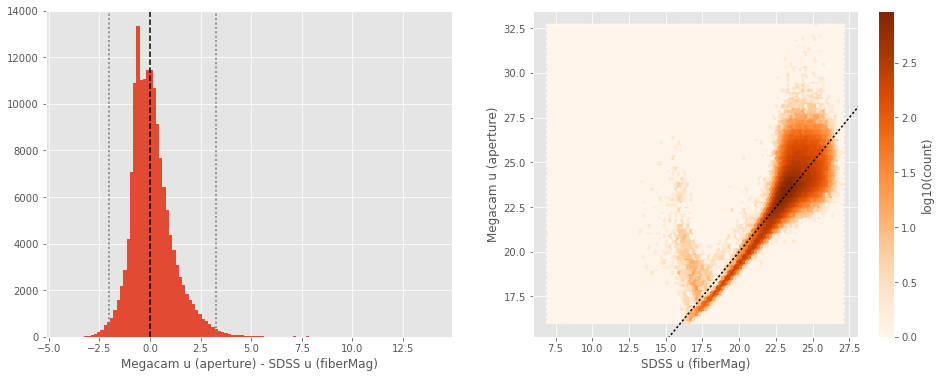

Megacam u (total) - SDSS u (petroMag):
- Median: -0.04
- Median Absolute Deviation: 0.59
- 1% percentile: -2.044686393737793
- 99% percentile: 3.2575323295593246


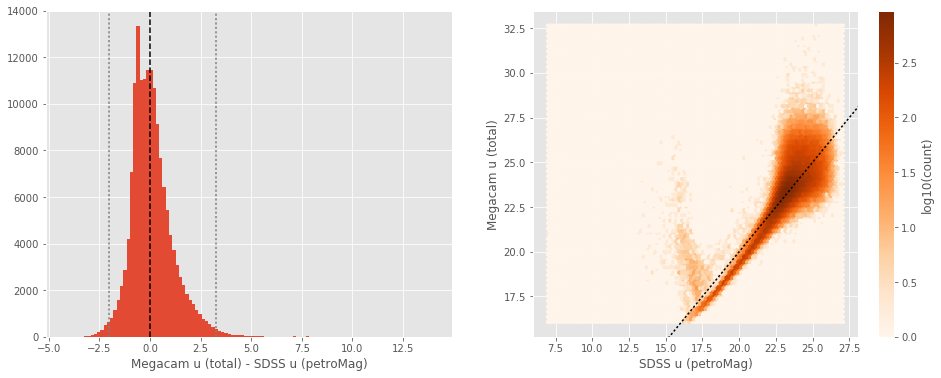

WFC g (aperture) - SDSS g (fiberMag):
- Median: -0.49
- Median Absolute Deviation: 0.12
- 1% percentile: -1.2727931022644043
- 99% percentile: 0.46194868087768726


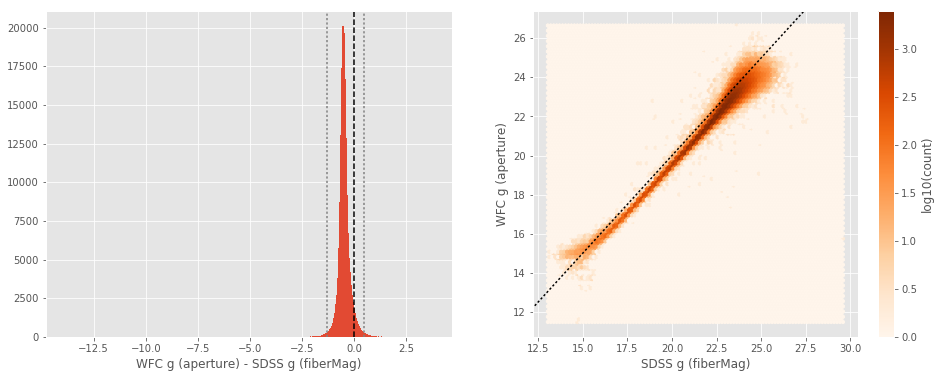

WFC g (total) - SDSS g (petroMag):
- Median: -0.49
- Median Absolute Deviation: 0.12
- 1% percentile: -1.2727931022644043
- 99% percentile: 0.46194868087768726


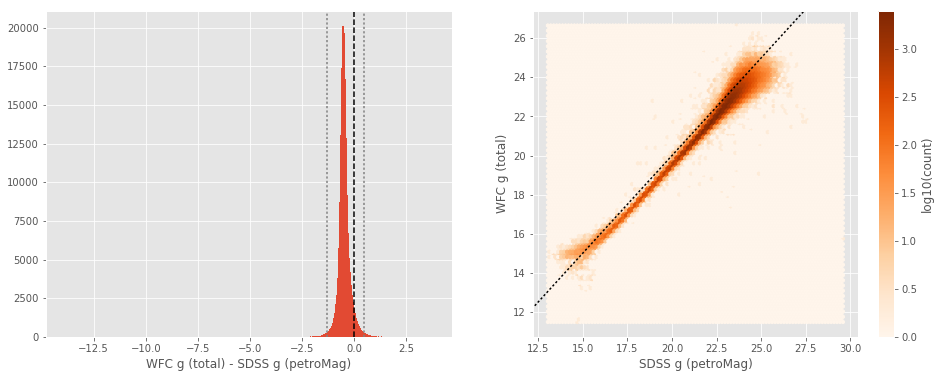

Megacam g (aperture) - SDSS g (fiberMag):
- Median: -0.33
- Median Absolute Deviation: 0.19
- 1% percentile: -1.2042931175231935
- 99% percentile: 2.403406810760495


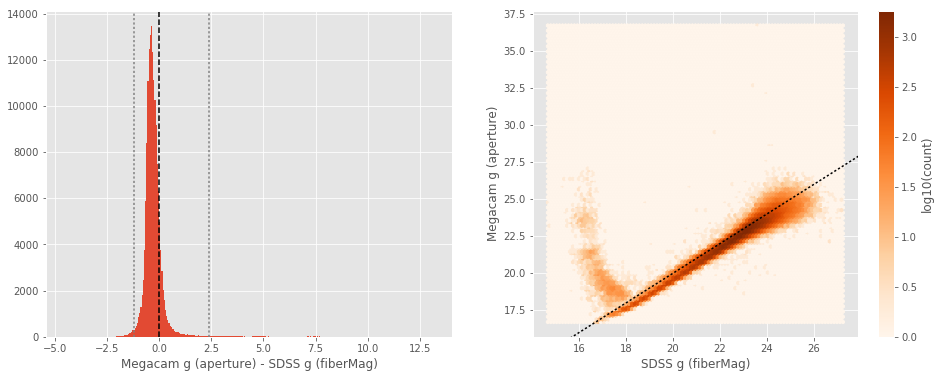

Megacam g (total) - SDSS g (petroMag):
- Median: -0.33
- Median Absolute Deviation: 0.19
- 1% percentile: -1.2042931175231935
- 99% percentile: 2.403406810760495


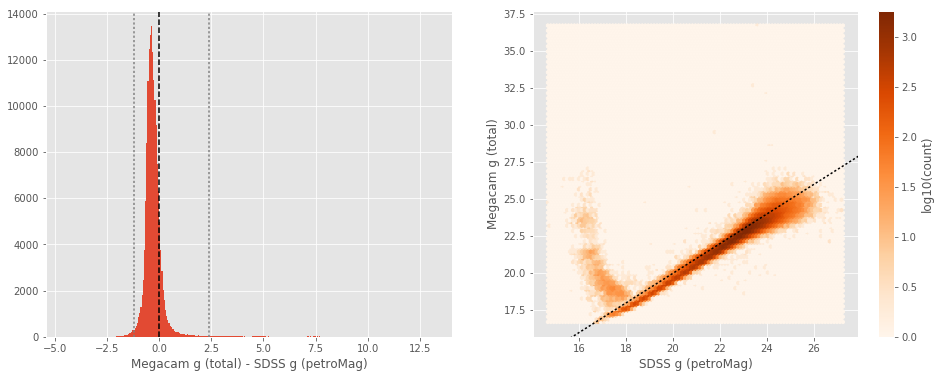

SUPRIME g (aperture) - SDSS g (fiberMag):
- Median: -0.28
- Median Absolute Deviation: 0.17
- 1% percentile: -1.1439088821411132
- 99% percentile: 1.2356151580810513


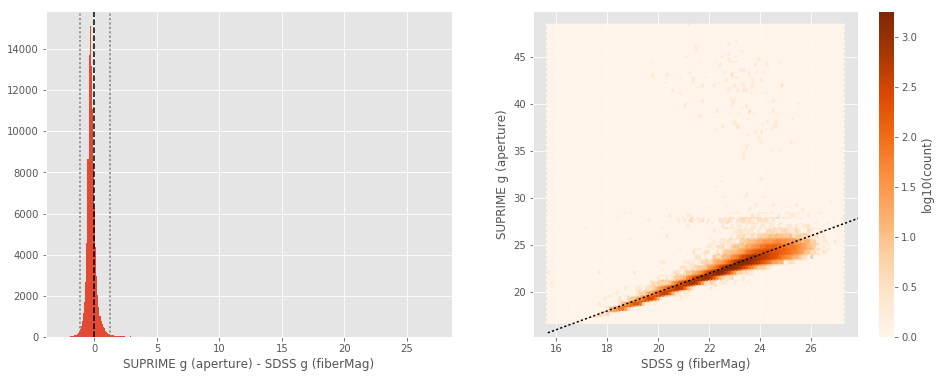

SUPRIME g (total) - SDSS g (petroMag):
- Median: -0.28
- Median Absolute Deviation: 0.17
- 1% percentile: -1.1439088821411132
- 99% percentile: 1.2356151580810513


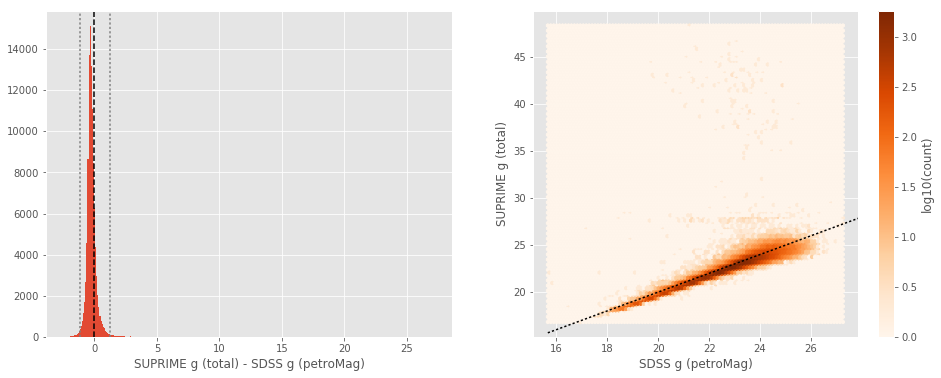

GPC1 g (aperture) - SDSS g (fiberMag):
- Median: -0.51
- Median Absolute Deviation: 0.24
- 1% percentile: -1.874479866027832
- 99% percentile: 1.9854761123657223


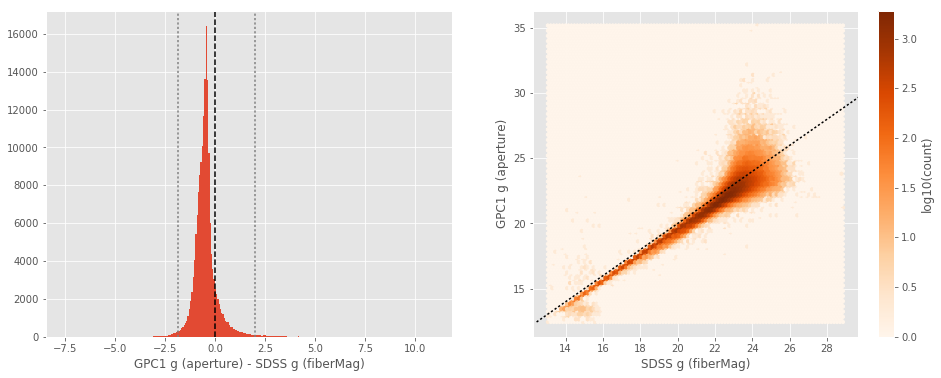

GPC1 g (total) - SDSS g (petroMag):
- Median: -0.51
- Median Absolute Deviation: 0.24
- 1% percentile: -1.874479866027832
- 99% percentile: 1.9854761123657223


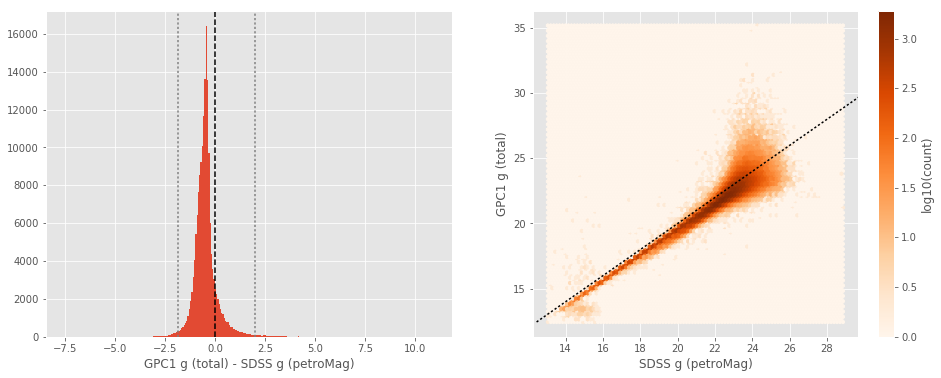

WFC r (aperture) - SDSS r (fiberMag):
- Median: -0.35
- Median Absolute Deviation: 0.08
- 1% percentile: -0.9242410278320312
- 99% percentile: 0.37569358825683397


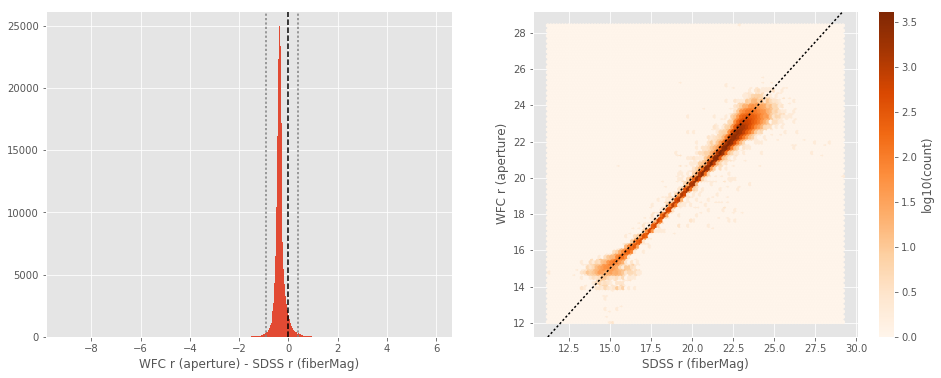

WFC r (total) - SDSS r (petroMag):
- Median: -0.35
- Median Absolute Deviation: 0.08
- 1% percentile: -0.9242410278320312
- 99% percentile: 0.37569358825683397


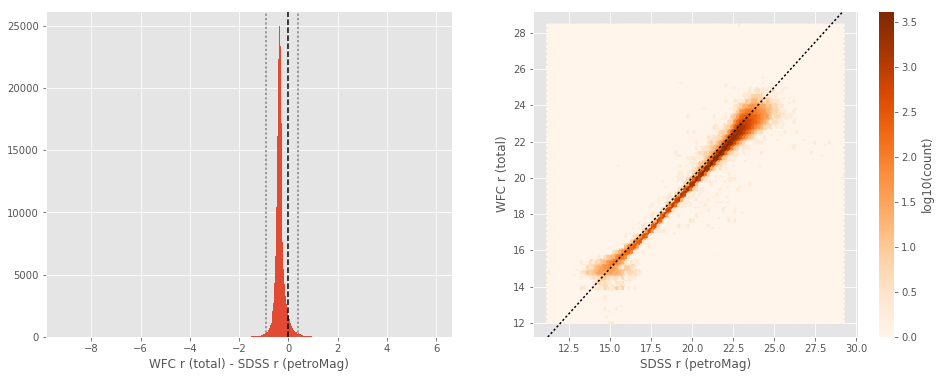

Megacam r (aperture) - SDSS r (fiberMag):
- Median: -0.24
- Median Absolute Deviation: 0.13
- 1% percentile: -0.8530236053466798
- 99% percentile: 2.6363726997375587


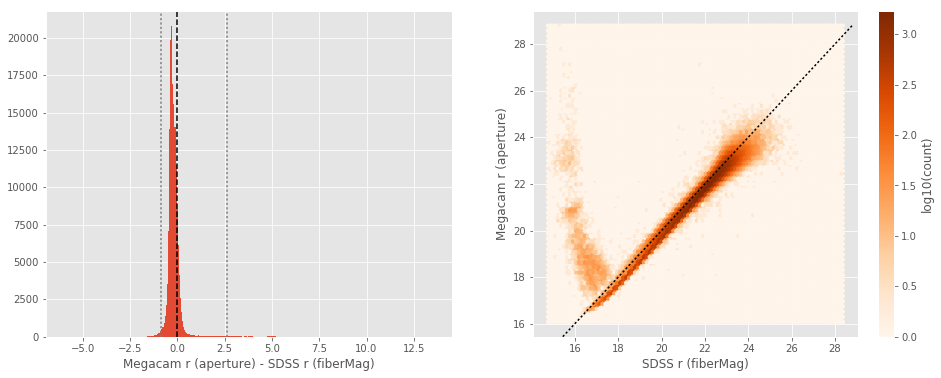

Megacam r (total) - SDSS r (petroMag):
- Median: -0.24
- Median Absolute Deviation: 0.13
- 1% percentile: -0.8530236053466798
- 99% percentile: 2.6363726997375587


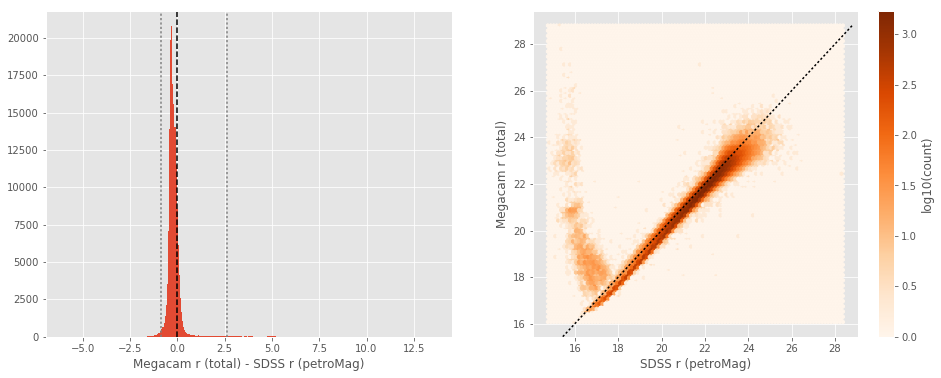

SUPRIME r (aperture) - SDSS r (fiberMag):
- Median: -0.25
- Median Absolute Deviation: 0.13
- 1% percentile: -0.8844428634643554
- 99% percentile: 2.346479873657227


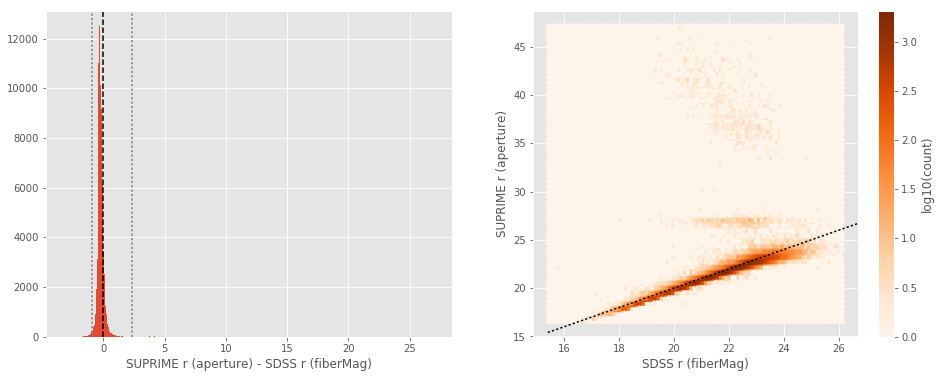

SUPRIME r (total) - SDSS r (petroMag):
- Median: -0.25
- Median Absolute Deviation: 0.13
- 1% percentile: -0.8844428634643554
- 99% percentile: 2.346479873657227


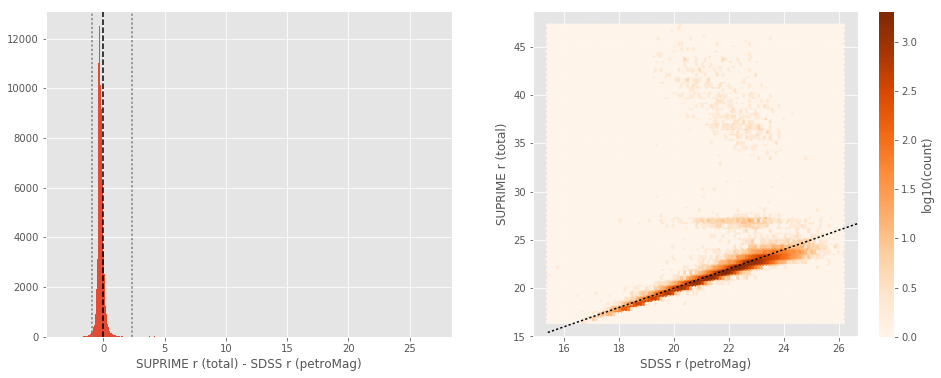

GPC1 r (aperture) - SDSS r (fiberMag):
- Median: -0.38
- Median Absolute Deviation: 0.14
- 1% percentile: -1.2143004417419432
- 99% percentile: 0.9139746665954609


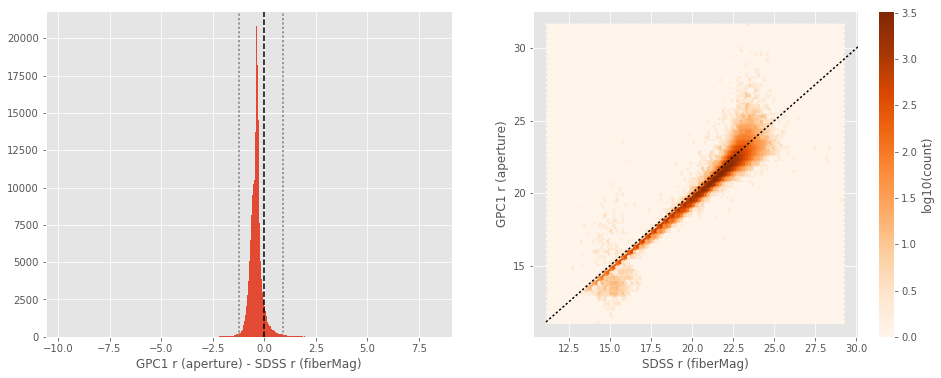

GPC1 r (total) - SDSS r (petroMag):
- Median: -0.38
- Median Absolute Deviation: 0.14
- 1% percentile: -1.2143004417419432
- 99% percentile: 0.9139746665954609


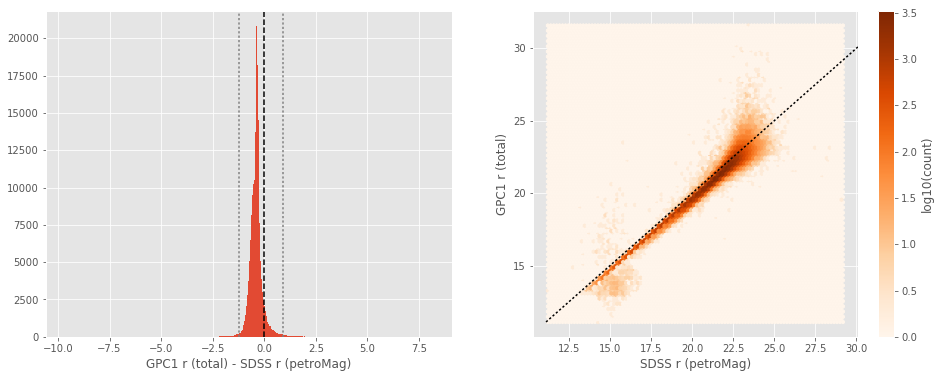

WFC i (aperture) - SDSS i (fiberMag):
- Median: -0.39
- Median Absolute Deviation: 0.08
- 1% percentile: -0.9540224075317383
- 99% percentile: 0.3984149932861357


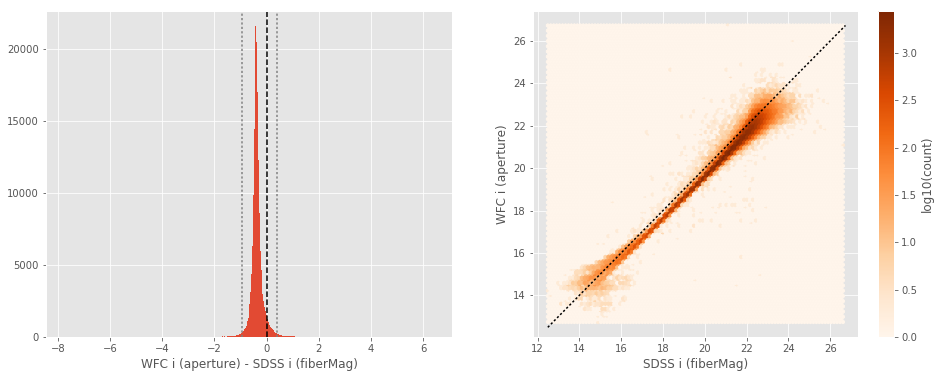

WFC i (total) - SDSS i (petroMag):
- Median: -0.39
- Median Absolute Deviation: 0.08
- 1% percentile: -0.9540224075317383
- 99% percentile: 0.3984149932861357


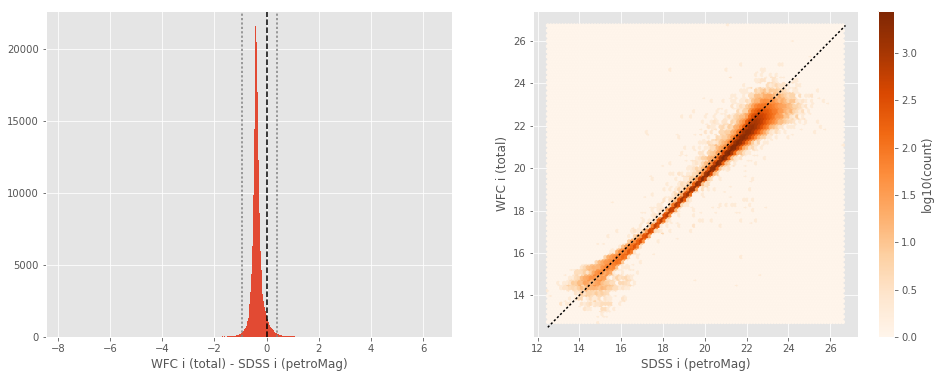

SUPRIME i (aperture) - SDSS i (fiberMag):
- Median: -0.30
- Median Absolute Deviation: 0.13
- 1% percentile: -0.890188274383545
- 99% percentile: 0.9026821899414045


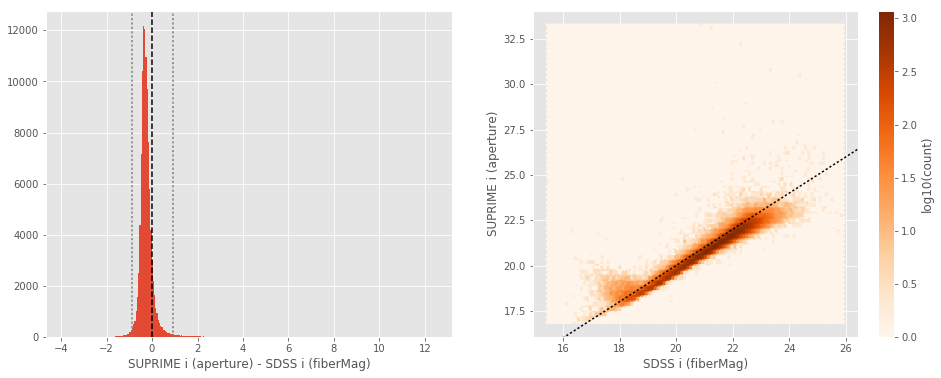

SUPRIME i (total) - SDSS i (petroMag):
- Median: -0.30
- Median Absolute Deviation: 0.13
- 1% percentile: -0.890188274383545
- 99% percentile: 0.9026821899414045


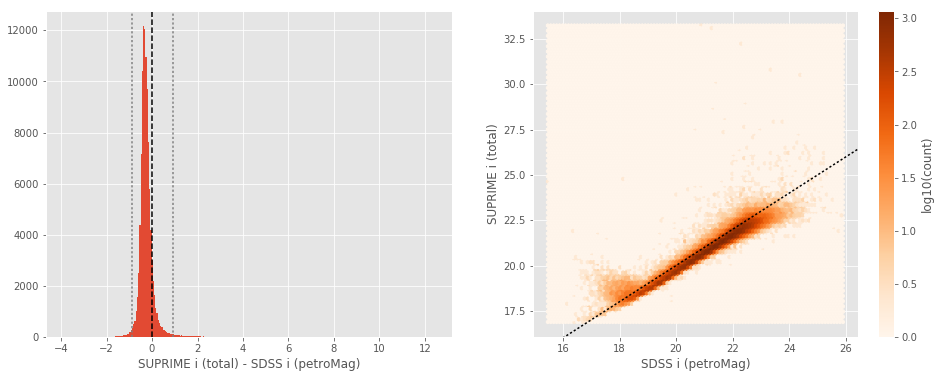

GPC1 i (aperture) - SDSS i (fiberMag):
- Median: -0.38
- Median Absolute Deviation: 0.10
- 1% percentile: -0.9555757713317872
- 99% percentile: 0.31397663116455077


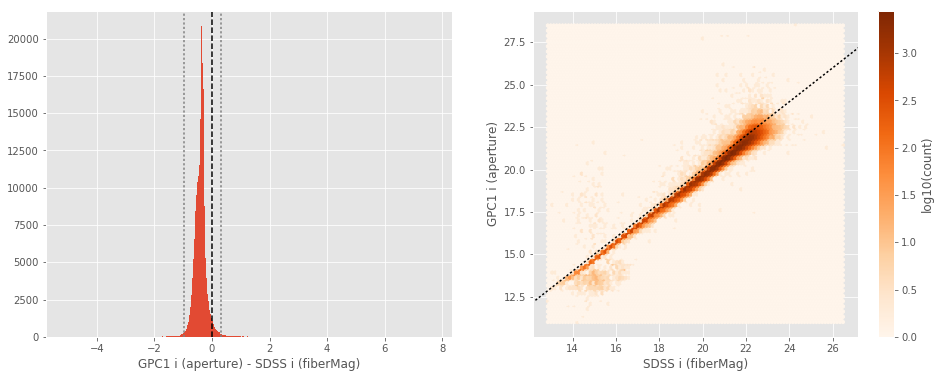

GPC1 i (total) - SDSS i (petroMag):
- Median: -0.38
- Median Absolute Deviation: 0.10
- 1% percentile: -0.9555757713317872
- 99% percentile: 0.31397663116455077


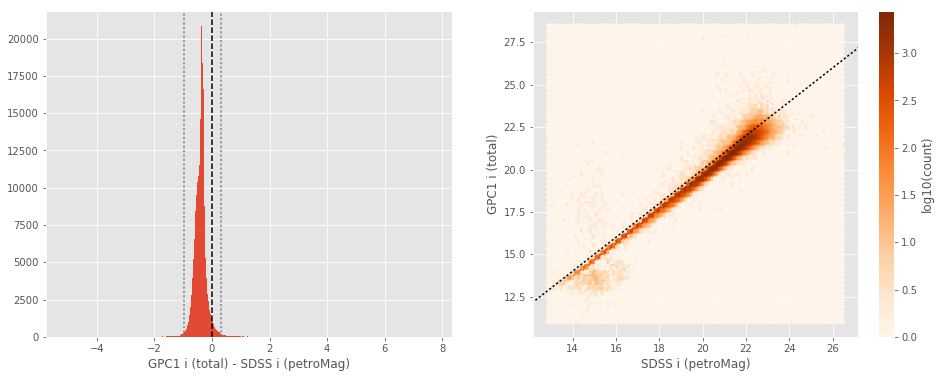

WFC z (aperture) - SDSS z (fiberMag):
- Median: -0.33
- Median Absolute Deviation: 0.13
- 1% percentile: -1.307823715209961
- 99% percentile: 0.7922947692871078


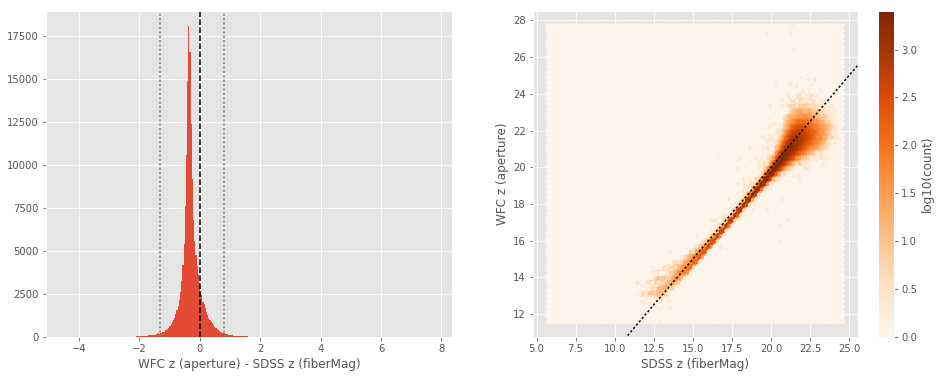

WFC z (total) - SDSS z (petroMag):
- Median: -0.33
- Median Absolute Deviation: 0.13
- 1% percentile: -1.307823715209961
- 99% percentile: 0.7922947692871078


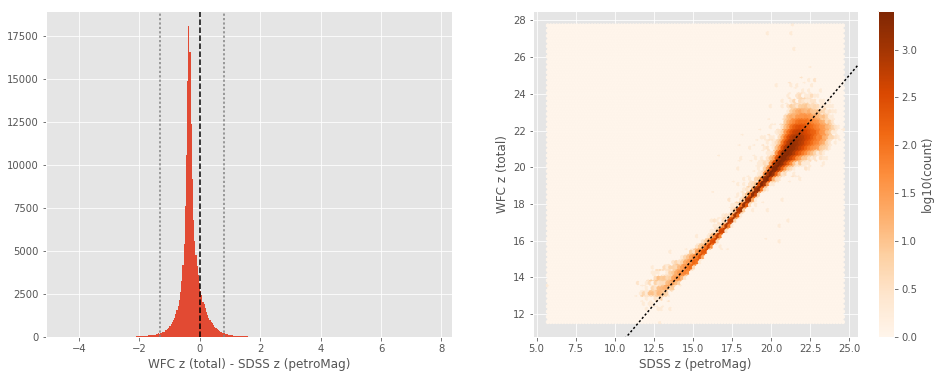

Megacam z (aperture) - SDSS z (fiberMag):
- Median: -0.19
- Median Absolute Deviation: 0.19
- 1% percentile: -1.167172966003418
- 99% percentile: 3.8105573463439564


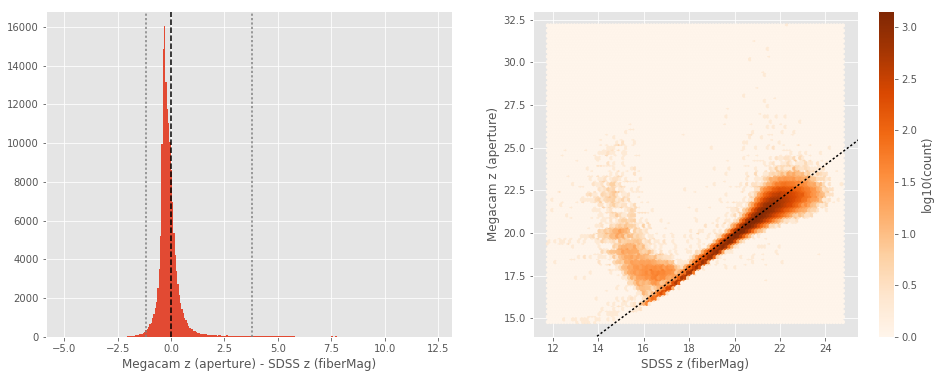

Megacam z (total) - SDSS z (petroMag):
- Median: -0.19
- Median Absolute Deviation: 0.19
- 1% percentile: -1.167172966003418
- 99% percentile: 3.8105573463439564


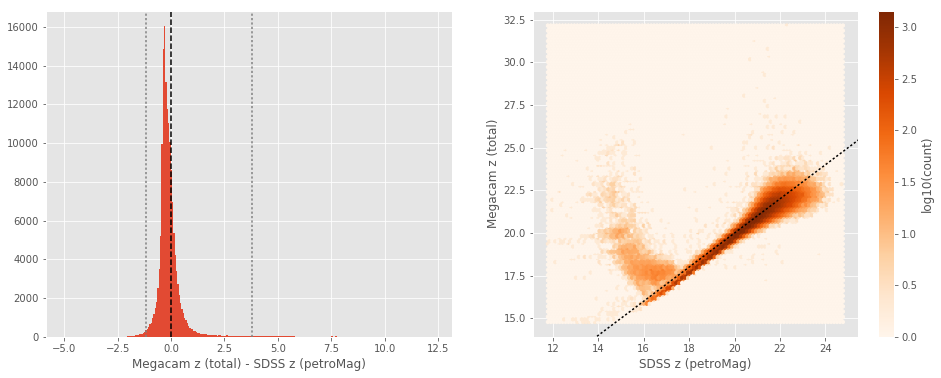

SUPRIME z (aperture) - SDSS z (fiberMag):
- Median: -0.22
- Median Absolute Deviation: 0.18
- 1% percentile: -1.1998800659179687
- 99% percentile: 0.9810749053955068


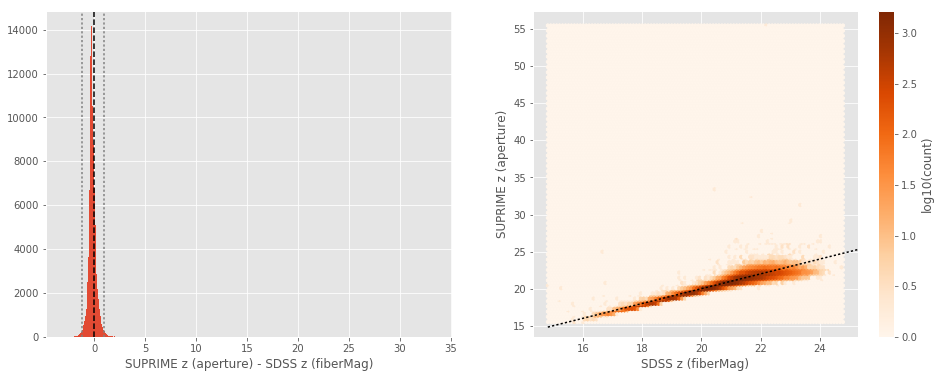

SUPRIME z (total) - SDSS z (petroMag):
- Median: -0.22
- Median Absolute Deviation: 0.18
- 1% percentile: -1.1998800659179687
- 99% percentile: 0.9810749053955068


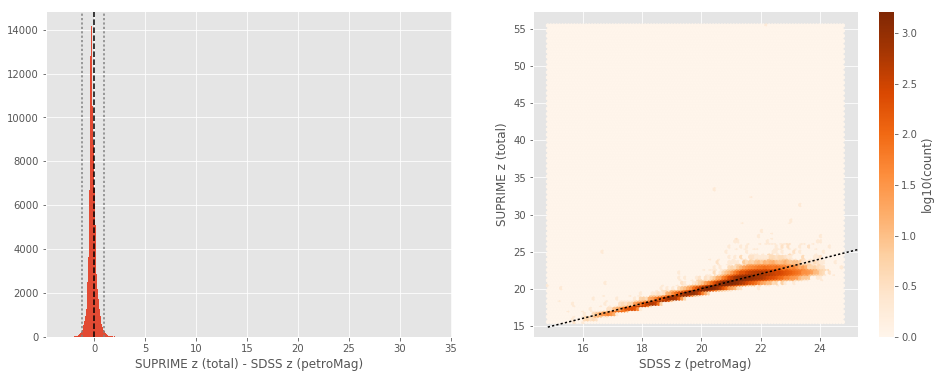

GPC1 z (aperture) - SDSS z (fiberMag):
- Median: -0.30
- Median Absolute Deviation: 0.16
- 1% percentile: -1.2933573722839355
- 99% percentile: 1.1849651336669922


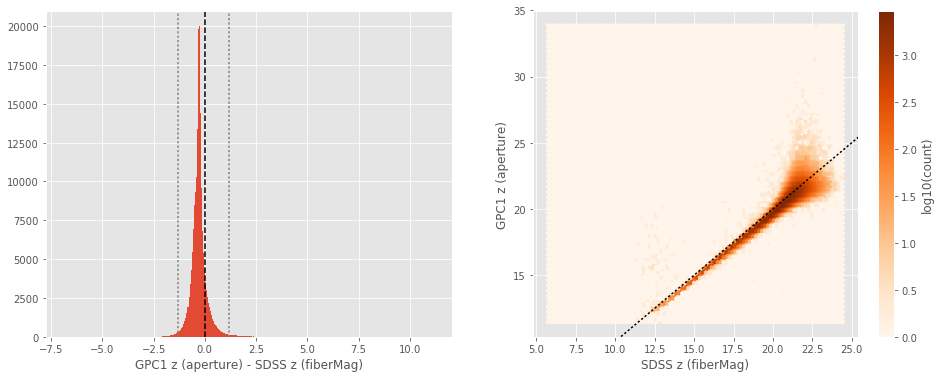

GPC1 z (total) - SDSS z (petroMag):
- Median: -0.30
- Median Absolute Deviation: 0.16
- 1% percentile: -1.2933573722839355
- 99% percentile: 1.1849651336669922


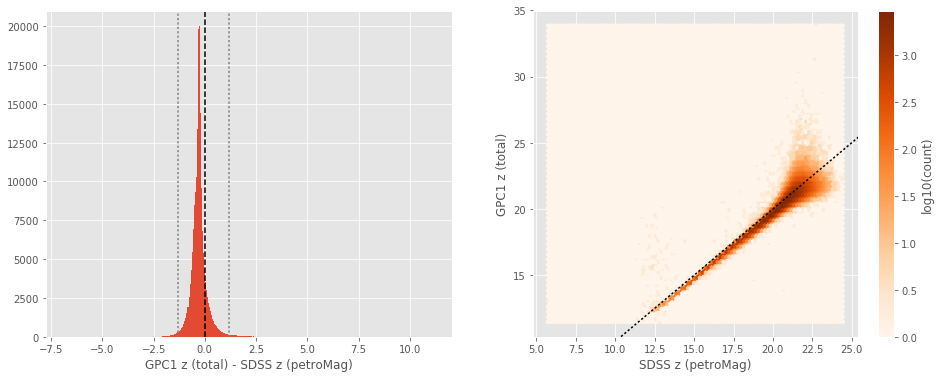

In [12]:
for band_of_a_kind in [u_bands, g_bands, r_bands, i_bands, z_bands]:
    for band in band_of_a_kind:
        
        sdss_mag_ap = sdss["fiberMag_{}".format(band[-1])]
        master_cat_mag_ap = master_catalogue["m_ap_{}".format(band.replace(" ", "_").lower())][ml_sdss_idx]
    
        nb_compare_mags(sdss_mag_ap, master_cat_mag_ap,
                        labels=("SDSS {} (fiberMag)".format(band[-1]), "{} (aperture)".format(band)))
    
        sdss_mag_tot = sdss["petroMag_{}".format(band[-1])]
        master_cat_mag_tot = master_catalogue["m_ap_{}".format(band.replace(" ", "_").lower())][ml_sdss_idx]
        
        nb_compare_mags(sdss_mag_ap, master_cat_mag_ap,
                        labels=("SDSS {} (petroMag)".format(band[-1]), "{} (total)".format(band)))

### III.b - Comparing J and K bands to 2MASS

The catalogue is cross-matched to 2MASS-PSC withing 0.2 arcsecond. We compare the UKIDSS total J and K magnitudes to those from 2MASS.

The 2MASS magnitudes are “*Vega-like*” and we have to convert them to AB magnitudes using the zero points provided on [this page](http://www.ipac.caltech.edu/2mass/releases/allsky/doc/sec6_4a.html):

| Band | Fν - 0 mag (Jy) |
|------|-----------------|
| J    | 1594            |
| H    | 1024            |
| Ks   | 666.7           |

In addition, UKIDSS uses a K band whereas 2MASS uses a Ks (“short”) band, [this page](http://www.ipac.caltech.edu/2mass/releases/allsky/doc/sec6_4b.html) give a correction to convert the K band in a Ks band with the formula:

$$K_{s(2MASS)} = K_{UKIRT} + 0.003 + 0.004 * (J−K)_{UKIRT}$$

In [13]:
# The AB zero point is 3631 Jy
j_2mass_to_ab = 2.5 * np.log10(3631/1595)
k_2mass_to_ab = 2.5 * np.log10(3631/666.7)

In [14]:
twomass = Table.read("../../dmu0/dmu0_2MASS-point-sources/data/2MASS-PSC_ELAIS-N1.fits")
twomass_coords = SkyCoord(twomass['raj2000'], twomass['dej2000'])

idx, d2d, _ = twomass_coords.match_to_catalog_sky(master_catalogue_coords)
mask = (d2d < 0.2 * u.arcsec)

twomass = twomass[mask]
ml_twomass_idx = idx[mask]

UKIDSS J (total) - 2MASS J:
- Median: 0.02
- Median Absolute Deviation: 0.05
- 1% percentile: -0.8077035259916129
- 99% percentile: 0.8731615960786883


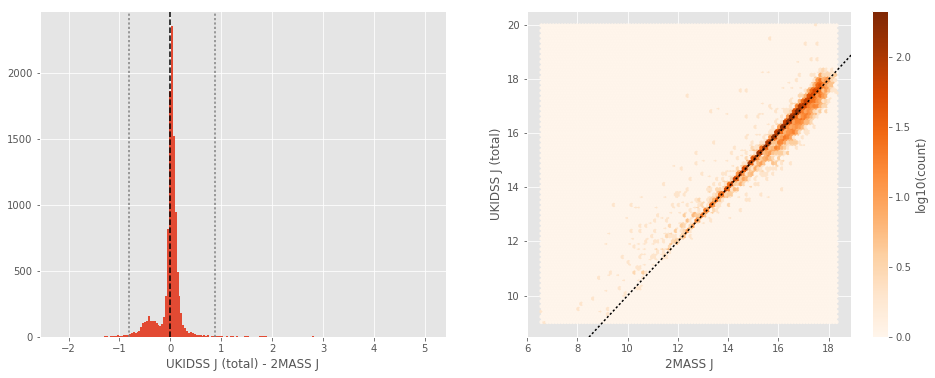

In [15]:
nb_compare_mags(twomass['jmag'] + j_2mass_to_ab, master_catalogue['m_ukidss_j'][ml_twomass_idx],
                labels=("2MASS J", "UKIDSS J (total)"))

UKIDSS Ks-like (total) - 2MASS Ks:
- Median: 0.07
- Median Absolute Deviation: 0.08
- 1% percentile: -0.7857970560320414
- 99% percentile: 1.1150006786481284


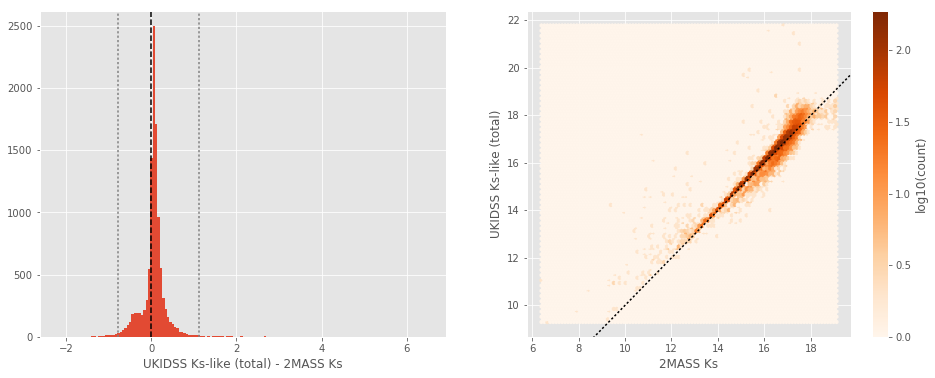

In [16]:
ukidss_ks_like = master_catalogue['m_ukidss_k'] + 0.003 + 0.004 * (
    master_catalogue['m_ukidss_j'] - master_catalogue['m_ukidss_k'])
nb_compare_mags(twomass['kmag'] + k_2mass_to_ab, ukidss_ks_like[ml_twomass_idx],
                labels=("2MASS Ks", "UKIDSS Ks-like (total)"))

## IV - Comparing aperture magnitudes to total ones.

Number of source used: 1487529 / 4026292 (36.95%)


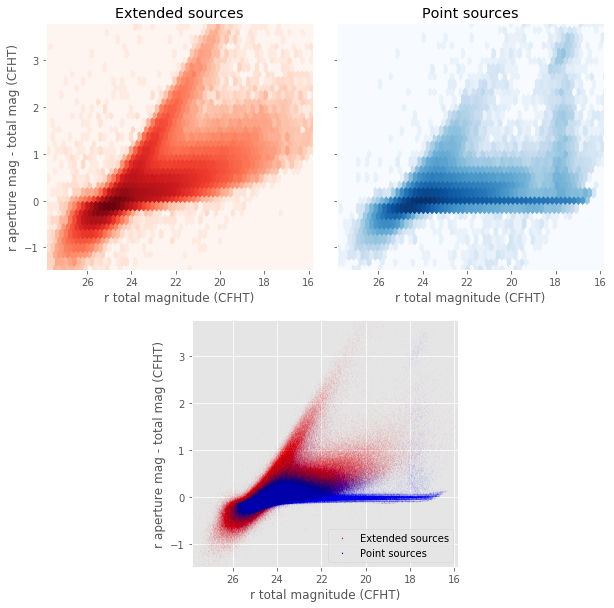

In [17]:
nb_ccplots(
    master_catalogue['m_megacam_r'],
    master_catalogue['m_ap_megacam_r'] - master_catalogue['m_megacam_r'],
    "r total magnitude (CFHT)", "r aperture mag - total mag (CFHT)",
    master_catalogue["stellarity"],
    invert_x=True
)

## V - Color-color and magnitude-color plots

Number of source used: 257658 / 4026292 (6.40%)


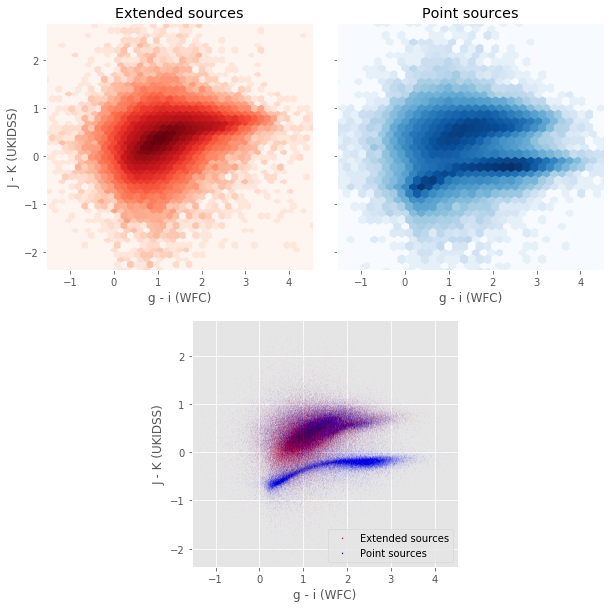

In [18]:
nb_ccplots(
    master_catalogue['m_wfc_g'] - master_catalogue['m_wfc_i'],
    master_catalogue['m_ukidss_j'] - master_catalogue['m_ukidss_k'],
    "g - i (WFC)", "J - K (UKIDSS)",
    master_catalogue["stellarity"]
)

Number of source used: 240005 / 4026292 (5.96%)


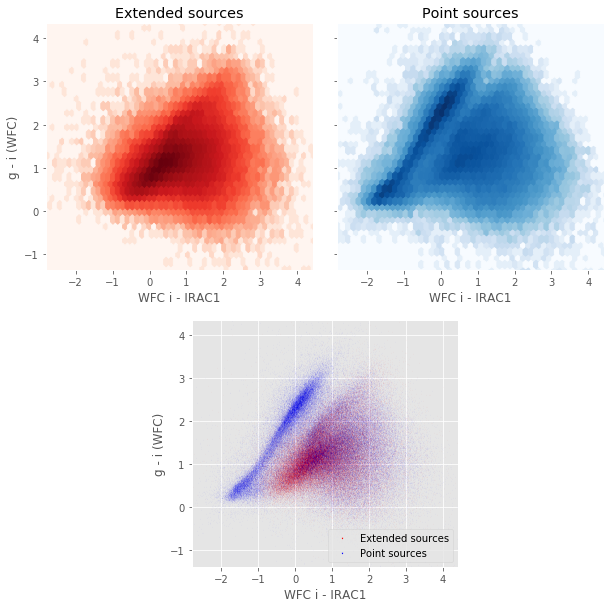

In [19]:
nb_ccplots(
    master_catalogue['m_wfc_i'] - master_catalogue['m_irac_i1'],
    master_catalogue['m_wfc_g'] - master_catalogue['m_wfc_i'],
    "WFC i - IRAC1", "g - i (WFC)",
    master_catalogue["stellarity"]
)

Number of source used: 1390609 / 4026292 (34.54%)


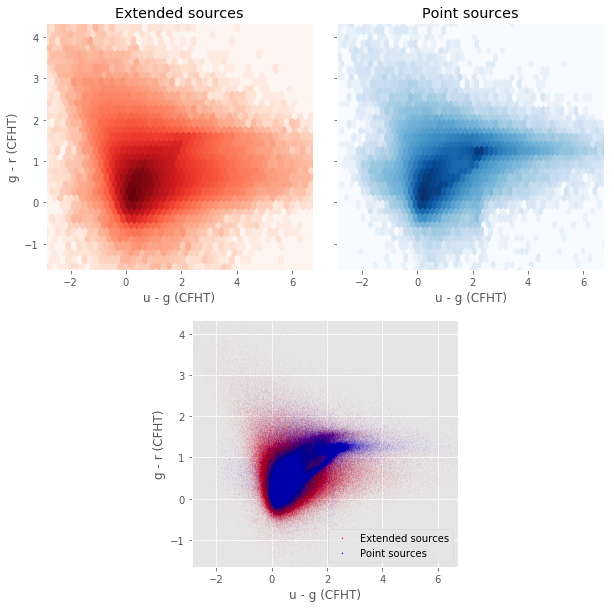

In [20]:
nb_ccplots(
    master_catalogue['m_megacam_u'] - master_catalogue['m_megacam_g'],
    master_catalogue['m_megacam_g'] - master_catalogue['m_megacam_r'],
    "u - g (CFHT)", "g - r (CFHT)",
    master_catalogue["stellarity"]
)

Number of source used: 286866 / 4026292 (7.12%)


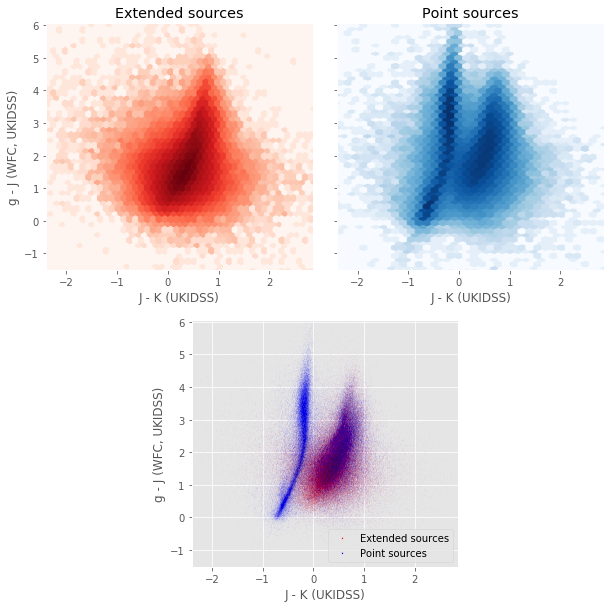

In [21]:
nb_ccplots(
    master_catalogue['m_ukidss_j'] - master_catalogue['m_ukidss_k'],
    master_catalogue['m_wfc_g'] - master_catalogue['m_ukidss_j'],
    "J - K (UKIDSS)", "g - J (WFC, UKIDSS)",
    master_catalogue["stellarity"]
)

Number of source used: 233217 / 4026292 (5.79%)


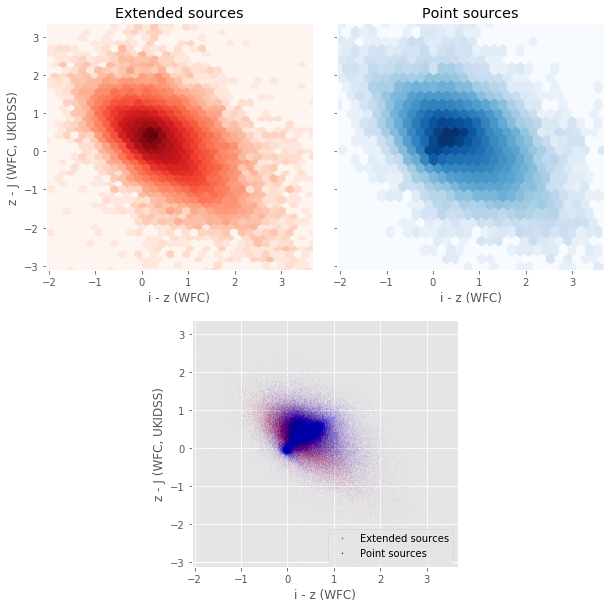

In [22]:
nb_ccplots(
    master_catalogue['m_wfc_i'] - master_catalogue['m_wfc_z'],
    master_catalogue['m_wfc_z'] - master_catalogue['m_ukidss_j'],
    "i - z (WFC)", "z - J (WFC, UKIDSS)",
    master_catalogue["stellarity"]
)

Number of source used: 40846 / 4026292 (1.01%)


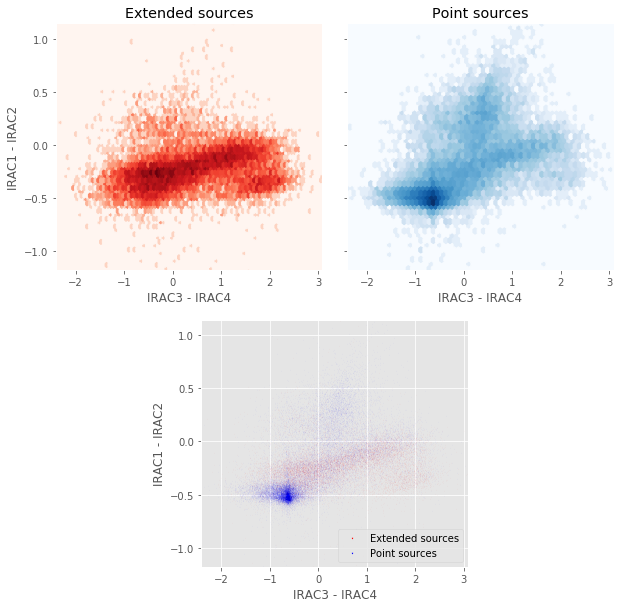

In [23]:
nb_ccplots(
    master_catalogue['m_irac_i3'] - master_catalogue['m_irac_i4'],
    master_catalogue['m_irac_i1'] - master_catalogue['m_irac_i2'],
    "IRAC3 - IRAC4", "IRAC1 - IRAC2",
    master_catalogue["stellarity"]
)